In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsOneClassifier
from sklearn.metrics import accuracy_score

from sklearn.model_selection import GroupKFold
from sklearn.metrics import roc_auc_score
import xgboost as xgb

import warnings
warnings.filterwarnings('ignore')


pd.set_option('display.max_columns', 150)

In [2]:
path1 = '/Users/zamiulalam/Documents/Fraud/ieee-fraud-detection/train_identity.csv'
path2 = '/Users/zamiulalam/Documents/Fraud/ieee-fraud-detection/train_transaction.csv'
path3 = '/Users/zamiulalam/Documents/Fraud/ieee-fraud-detection/test_identity.csv'
path4 = '/Users/zamiulalam/Documents/Fraud/ieee-fraud-detection/test_transaction.csv'

id = pd.read_csv(path1)
tranz = pd.read_csv(path2)
id_test = pd.read_csv(path3)
tranz_test = pd.read_csv(path4)

In [3]:
id.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,52.0,NaN,Found,Found,121.0,NaN,410.0,142.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,NaN,New,NotFound,225.0,NaN,176.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,NaN,-300.0,Found,Found,166.0,15.0,529.0,575.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [4]:
tranz.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,...,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,28.0,0.0,0.0,0.0,0.0,10.0,0.0,4.0,0.0,0.0,1.0,1.0,1.0,1.0,38.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
tranz = tranz.merge(id, how='left', on='TransactionID')
tranz_test = tranz_test.merge(id_test, how = 'left', on = 'TransactionID')

In [6]:
for col, values in tranz.items():
    num_uniques = values.nunique()
    print ('{name}: {num_unique}'.format(name=col, num_unique=num_uniques))
    print (values.unique()[0:5])
    print ('\n')

TransactionID: 590540
[2987000 2987001 2987002 2987003 2987004]


isFraud: 2
[0 1]


TransactionDT: 573349
[86400 86401 86469 86499 86506]


TransactionAmt: 20902
[68.5 29.  59.  50.  49. ]


ProductCD: 5
['W' 'H' 'C' 'S' 'R']


card1: 13553
[13926  2755  4663 18132  4497]


card2: 500
[ nan 404. 490. 567. 514.]


card3: 114
[150. 117. 185. 143. 144.]


card4: 4
['discover' 'mastercard' 'visa' 'american express' nan]


card5: 119
[142. 102. 166. 117. 226.]


card6: 4
['credit' 'debit' nan 'debit or credit' 'charge card']


addr1: 332
[315. 325. 330. 476. 420.]


addr2: 74
[87. nan 96. 35. 60.]


dist1: 2651
[ 19.  nan 287.  36.   0.]


dist2: 1751
[ nan  30.  98. 149.  84.]


P_emaildomain: 59
[nan 'gmail.com' 'outlook.com' 'yahoo.com' 'mail.com']


R_emaildomain: 60
[nan 'gmail.com' 'hotmail.com' 'outlook.com' 'anonymous.com']


C1: 1657
[  1.   2.   4.   6. 127.]


C2: 1216
[  1.   5.   2.   4. 120.]


C3: 27
[0. 1. 8. 3. 2.]


C4: 1260
[0. 1. 2. 3. 4.]


C5: 319
[  0.   2.   1. 168.

In [7]:
#Find the number of missing values in each column
miss_val_tranz = tranz.isnull().sum()

#Turn the missing value counts into percentages
miss_val_per_tranz = (miss_val_tranz/ len(tranz))*100

#Return counts and percentages of missing values in each column
miss_data_tranz = pd.DataFrame({'MIssing Values': miss_val_tranz,'Percentage (%)':miss_val_per_tranz})

#Sort values in ascending order 
miss_data_tranz = miss_data_tranz.sort_values(by='Percentage (%)', ascending=True)

miss_data_tranz.tail(50)

,MIssing Values,Percentage (%)
V143,508589,86.122701
V159,508589,86.122701
V160,508589,86.122701
V164,508589,86.122701
V166,508589,86.122701
V142,508595,86.123717
V141,508595,86.123717
V140,508595,86.123717
V139,508595,86.123717
V138,508595,86.123717


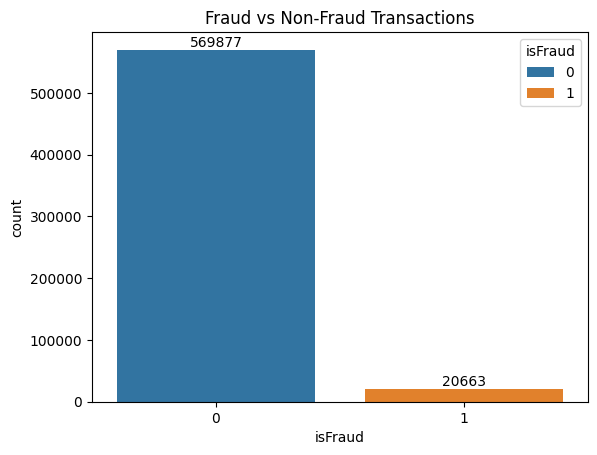

In [8]:
ax = sns.countplot(x='isFraud', data=tranz, hue='isFraud')
plt.title('Fraud vs Non-Fraud Transactions')

for container in ax.containers:
    ax.bar_label(container) # type: ignore

plt.show()

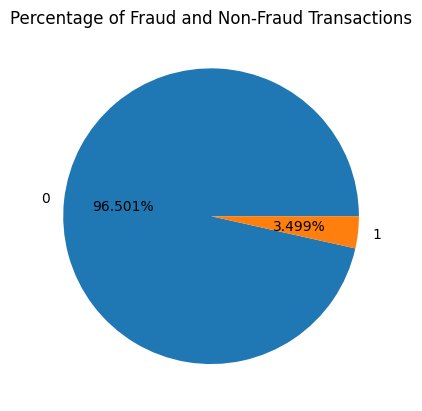

In [9]:
# get the set of distinct classes
labelz = tranz.isFraud.unique()

sizes = tranz.isFraud.value_counts().values

# plot the class value counts
fig, ax = plt.subplots()
ax.pie(np.array(sizes), labels=labelz.astype(str).tolist(), autopct='%1.3f%%')
ax.set_title('Percentage of Fraud and Non-Fraud Transactions')
plt.show()

In [10]:
(tranz['TransactionDT'].max() - tranz['TransactionDT'].min())/ 86400

181.99920138888888

In [11]:
tranz['TransactionDTz'] = pd.to_datetime(tranz['TransactionDT'], unit='s', origin=pd.Timestamp('2000-01-01'))
tranz_test['TransactionDTz'] = pd.to_datetime(tranz_test['TransactionDT'], unit='s', origin=pd.Timestamp('2000-01-01'))

In [12]:
tranz['Date'] = tranz['TransactionDTz'].dt.day
tranz['Hour'] = tranz['TransactionDTz'].dt.hour

In [13]:
tranz.sample(5)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,...,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,TransactionDTz,Date,Hour
174307,3161307,0,3782827,137.00,W,11162,346.0,150.0,mastercard,224.0,debit,299.0,87.0,NaN,NaN,gmail.com,NaN,2.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,24.0,2.0,101.0,100.0,5.0,339.0,5.0,NaN,NaN,NaN,NaN,513.0,NaN,NaN,NaN,NaN,513.0,NaN,NaN,NaN,M1,T,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,335.000000,0.000000,668.000000,0.000000,335.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-02-13 18:47:07,13,18
331328,3318328,0,8134085,209.95,W,9803,583.0,150.0,visa,226.0,credit,325.0,87.0,NaN,NaN,anonymous.com,NaN,3.0,2.0,0.0,0.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0,4.0,3.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,T,T,F,NaN,NaN,T,F,T,T,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,154.970001,154.970001,154.970001,154.970001,154.970001,154.970001,154.970001,154.970001,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-04-04 03:28:05,4,3
481054,3468054,0,12507249,12.50,W,14079,360.0,150.0,mastercard,126.0,debit,126.0,87.0,5.0,NaN,gmail.com,NaN,5.0,3.0,0.0,0.0,0.0,4.0,0.0,0.0,2.0,0.0,1.0,0.0,27.0,5.0,4.0,4.0,4.0,287.0,4.0,NaN,NaN,NaN,NaN,54.0,358.0,NaN,NaN,NaN,358.0,T,T,T,M0,F,T,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,35.000000,0.000000,35.000000,0.000000,35.000000,35.000000,35.000000,35.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-05-24 18:14:09,24,18
254479,3241479,0,6095666,75.00,R,4545,399.0,150.0,american express,223.0,credit,204.0,87.0,NaN,130.0,gmail.com,anonymous.com,1.0,1.0,0.0,2.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,0.0,3.0,1.0,187.0,187.0,NaN,187.0,1.0,NaN,NaN,1.541666,0.541666,187.0,NaN,NaN,NaN,NaN,187.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,...,175.000000,175.000000,175.000000,0.000000,175.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,175.0,175.0,175.0,175.0,175.0,175.0,0.0,0.0,0.0,-35.0,66433.0,NaN,NaN,0.0,-9.0,NaN,NaN,0.0,0.0,100.0,Found,62.0,-300.0,Unknown,NaN,166.0,12.0,193.0,333.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Windows 7,chrome 63.0,24.0,1920x1080,match_status:2,T,F,F,F,desktop,Windows,2000-03-11 13:14:26,11,13
518859,3505859,0,13622033,210.95,W,12034,122.0,150.0,mastercard,126.0,debit,143.0,87.0,6.0,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,2.0,1.0,48.0,48.0,48.0,48.0,48.0,NaN,NaN,NaN,NaN,48.0,48.0,NaN,NaN,NaN,48.0,T,T,T,NaN,NaN,F,F,F,T,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.

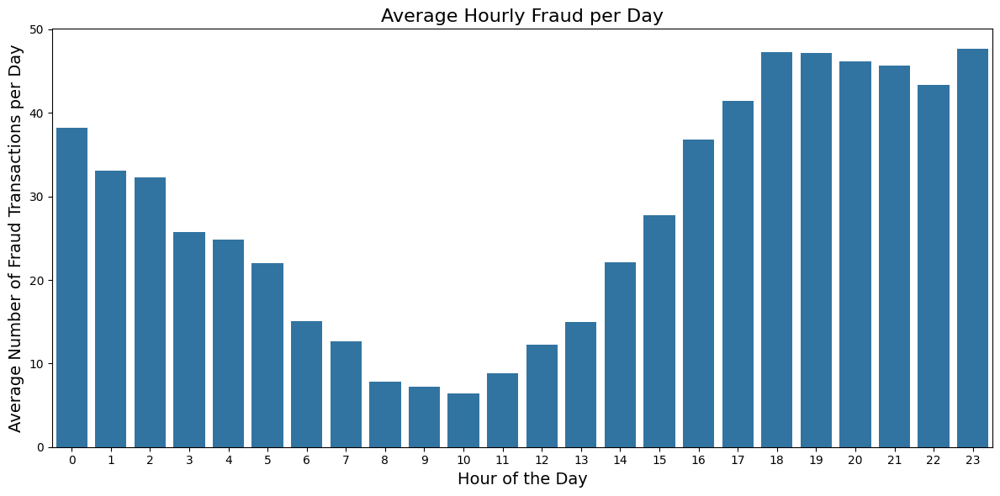

In [14]:
# Group by date and hour, count fraud
daily_hourly_fraud = tranz[tranz['isFraud'] == 1].groupby(['Date', 'Hour']).size().reset_index(name='Fraud_Count')

# Now, compute the average fraud count per hour across all days
hourly_avg = daily_hourly_fraud.groupby('Hour')['Fraud_Count'].mean().reset_index(name='Avg_Fraud_Per_Hour')

# Plot the average hourly fraud
plt.figure(figsize=(12, 6))
sns.barplot(data=hourly_avg, x='Hour', y='Avg_Fraud_Per_Hour')
plt.title('Average Hourly Fraud per Day', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Average Number of Fraud Transactions per Day', fontsize=14)
plt.tight_layout()
plt.show()

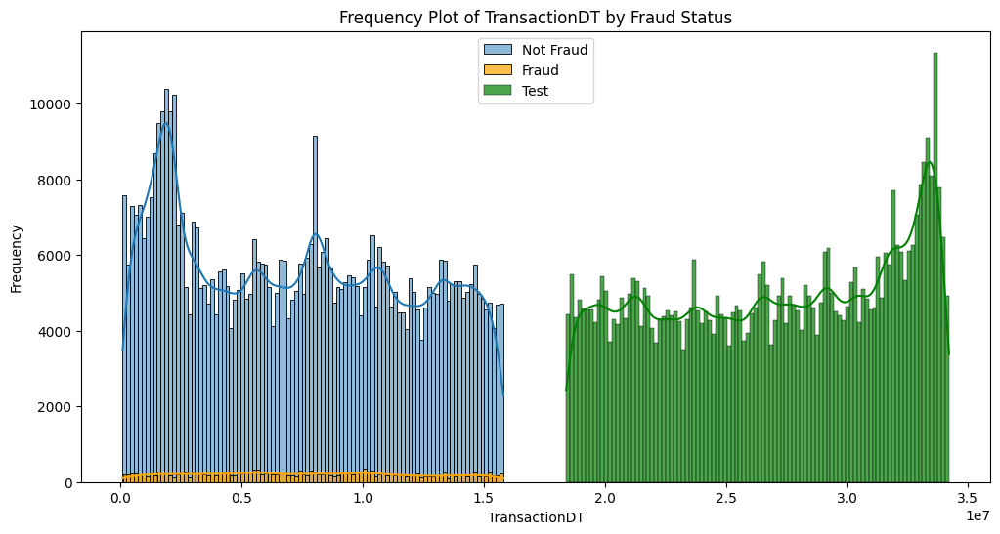

In [15]:
plt.figure(figsize=(12, 6))

sns.histplot(x=tranz[tranz['isFraud'] == 0]['TransactionDT'], bins=100, kde=True, color='tab:blue', label='Not Fraud', alpha=0.5)
sns.histplot(x=tranz[tranz['isFraud'] == 1]['TransactionDT'], bins=100,  kde=True, color='orange', label='Fraud', alpha=0.7)
sns.histplot(x=tranz_test['TransactionDT'], bins=100,  kde=True, color='green', label='Test', alpha=0.7)
plt.title('Frequency Plot of TransactionDT by Fraud Status')
plt.xlabel('TransactionDT')
plt.ylabel('Frequency')
plt.legend()
plt.show()

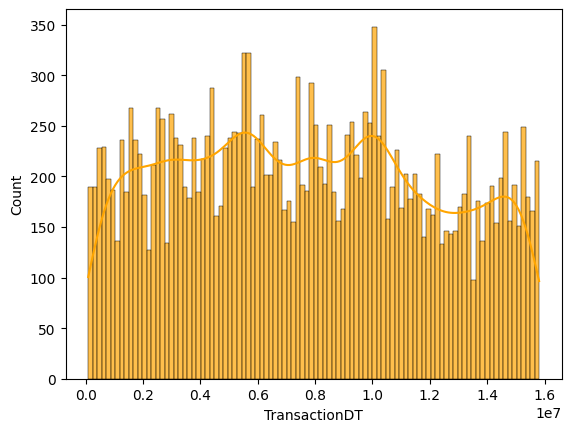

In [16]:
sns.histplot(x=tranz[tranz['isFraud'] == 1]['TransactionDT'], bins=100, kde=True, color='orange', label='Fraud', alpha=0.7)
plt.show()

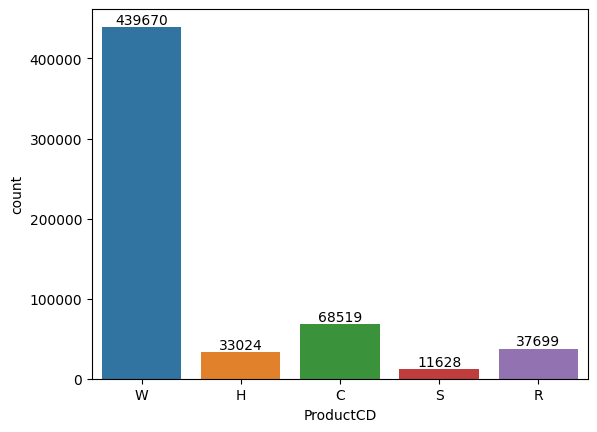

In [17]:
ax = sns.countplot(x='ProductCD', data=tranz, hue='ProductCD')

for container in ax.containers:
    ax.bar_label(container) # type: ignore

plt.show()

In [18]:
tranz.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,...,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,TransactionDTz,Date,Hour
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-01-02 00:00:00,2,0
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-01-02 00:00:01,2,0
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-01-02 00:01:09,2,0
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-01-02 00:01:39,2,0
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0

In [19]:
def make_plots(cols_prefix,start,end):
    m_columns = [f'{cols_prefix}{i}' for i in range(start, end+1)]

    fig, axes = plt.subplots(nrows= len(m_columns)//3, ncols = 4, figsize=(18,12))
    axes = axes.flatten()

    for idx, colz in enumerate(m_columns):
        sns.histplot(x=tranz[colz].dropna(), bins=100, ax=axes[idx], kde=False)
        axes[idx].set_title(colz)
        axes[idx].set_xlabel('')
        axes[idx].set_ylabel('Count')


    plt.tight_layout()
    plt.show()

In [20]:
def make_scplots(cols_prefix,start,end):

    d_columns = [f'{cols_prefix}{i}' for i in range(start, end+1)]

    fig, axes = plt.subplots(nrows= len(d_columns)//3, ncols=4, figsize=(18,12))
    axes = axes.flatten()

    for idx, colz in enumerate(d_columns):
        sns.scatterplot(data=tranz, x='TransactionDT', y=colz, ax=axes[idx])
        axes[idx].set_title(colz)


    plt.tight_layout()
    plt.show()

In [21]:
def col_eda(col_prefix, start, end):
	cols = tranz[[f'{col_prefix}{i}' for i in range(start, end+1)]].copy()

	# Find the number of missing values in each column
	miss_val_cols = cols.isnull().sum()
	miss_val_per_cols = (miss_val_cols / len(cols)) * 100
	miss_data_cols = pd.DataFrame({'Missing Values': miss_val_cols, 'Percentage (%)': miss_val_per_cols})

	print(miss_data_cols.sort_values(by='Percentage (%)', ascending=True))
	print('\n')
	print('Columns 50 percent of whose data is not nan :')
	print(miss_data_cols[miss_data_cols['Percentage (%)'] < 50].index.tolist())


	# Fill missing values before converting to int
	cols = cols.fillna(-999)


	# Map 'T' to 1, 'F' to 0
	#cols = cols.map(lambda x: 1 if x == 'T' else 0 if x == 'F' else x)


	for col in cols.columns:
		if cols[col].dtype == 'object':
			cols[col] = pd.factorize(cols[col])[0]
		else:
			cols[col] = cols[col].astype(int)


	corr_matrix = cols.corr()

	plt.figure(figsize=(10, 10))
	sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
	plt.title(f"Correlation Heatmap for {col_prefix}")
	plt.show()

	print('\n')
	print(cols)

	cols_name = cols.columns.tolist()

	make_plots(f'{col_prefix}',start,end)

	make_scplots(f'{col_prefix}',start,end)

	return

       Missing Values  Percentage (%)
card1               0        0.000000
card3            1565        0.265012
card6            1571        0.266028
card4            1577        0.267044
card5            4259        0.721204
card2            8933        1.512683


Columns 50 percent of whose data is not nan :
['card1', 'card2', 'card3', 'card4', 'card5', 'card6']


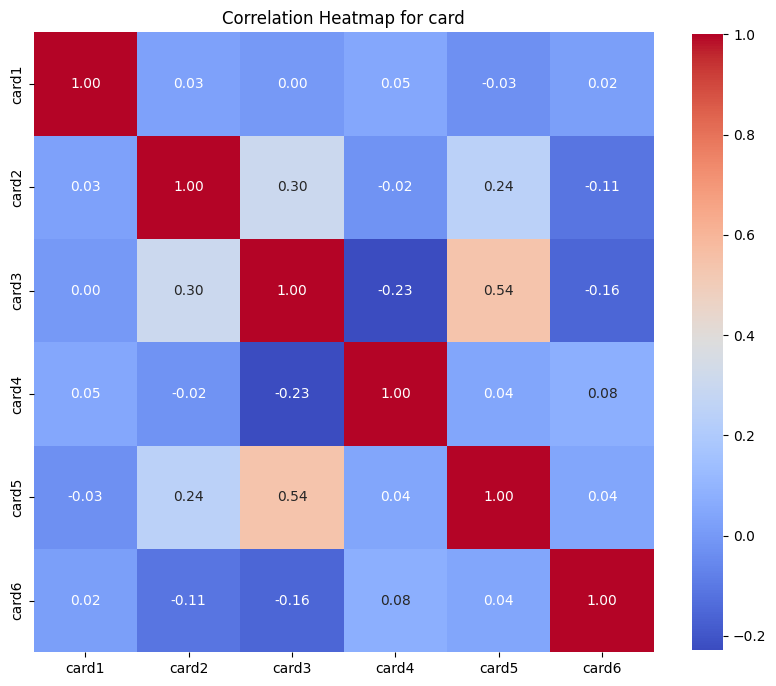



        card1  card2  card3  card4  card5  card6
0       13926   -999    150      0    142      0
1        2755    404    150      1    102      0
2        4663    490    150      2    166      1
3       18132    567    150      1    117      1
4        4497    514    150      1    102      0
...       ...    ...    ...    ...    ...    ...
590535   6550   -999    150      2    226      1
590536  10444    225    150      1    224      1
590537  12037    595    150      1    224      1
590538   7826    481    150      1    224      1
590539  15066    170    150      1    102      0

[590540 rows x 6 columns]


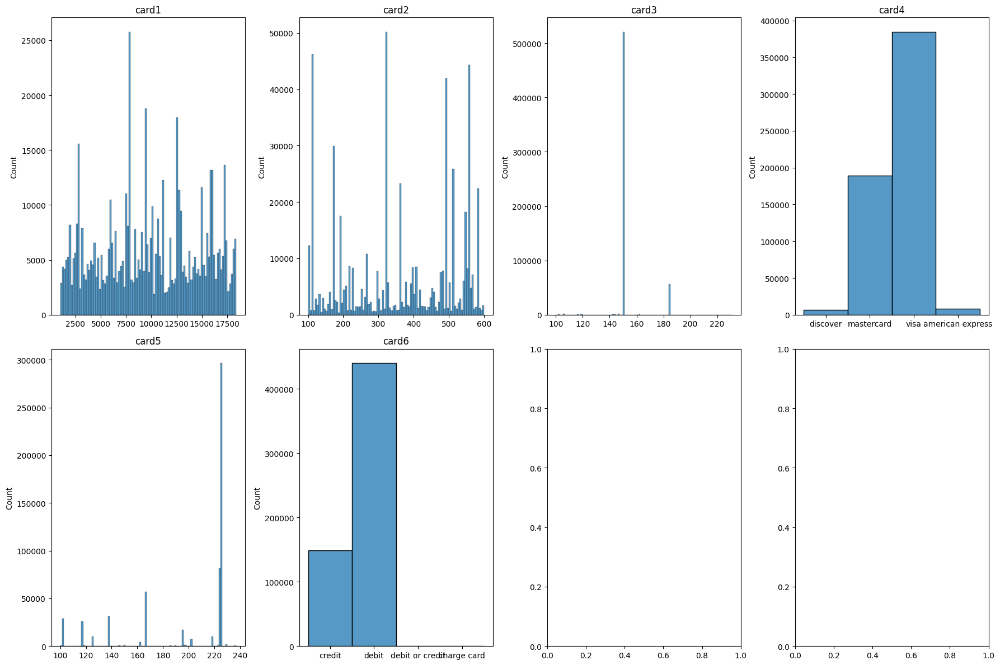

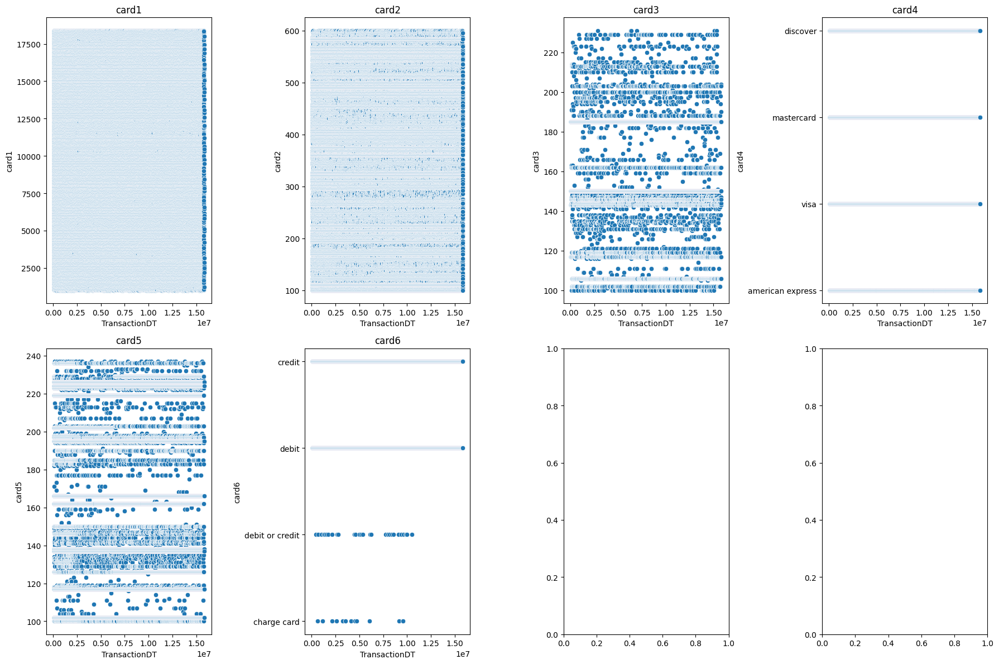

In [22]:
col_eda('card',1,6)

In [23]:
print(len(sorted(tranz['addr1'].unique())))

print(sorted(tranz['addr1'].unique()))

333
[100.0, 101.0, 122.0, 123.0, 126.0, 143.0, 158.0, 170.0, 177.0, 181.0, 184.0, 191.0, 204.0, 205.0, 220.0, 225.0, 226.0, 231.0, 251.0, 264.0, 269.0, 272.0, 299.0, 308.0, 310.0, 315.0, 325.0, 327.0, 330.0, 337.0, 343.0, 387.0, 420.0, 433.0, 436.0, 441.0, 469.0, 472.0, 476.0, nan, 102.0, 104.0, 105.0, 106.0, 110.0, 111.0, 112.0, 113.0, 117.0, 119.0, 120.0, 124.0, 125.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 137.0, 139.0, 141.0, 142.0, 144.0, 145.0, 146.0, 148.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 159.0, 160.0, 161.0, 162.0, 163.0, 164.0, 166.0, 167.0, 168.0, 171.0, 172.0, 174.0, 178.0, 180.0, 182.0, 183.0, 185.0, 187.0, 189.0, 190.0, 193.0, 194.0, 195.0, 196.0, 198.0, 199.0, 200.0, 201.0, 202.0, 203.0, 206.0, 208.0, 210.0, 211.0, 213.0, 214.0, 215.0, 216.0, 217.0, 218.0, 219.0, 221.0, 223.0, 224.0, 227.0, 232.0, 233.0, 234.0, 235.0, 236.0, 237.0, 238.0, 239.0, 241.0, 242.0, 243.0, 244.0, 245.0, 247.0, 248.0, 249.0, 250.0, 252.0, 253.0, 254.0, 255.0, 257

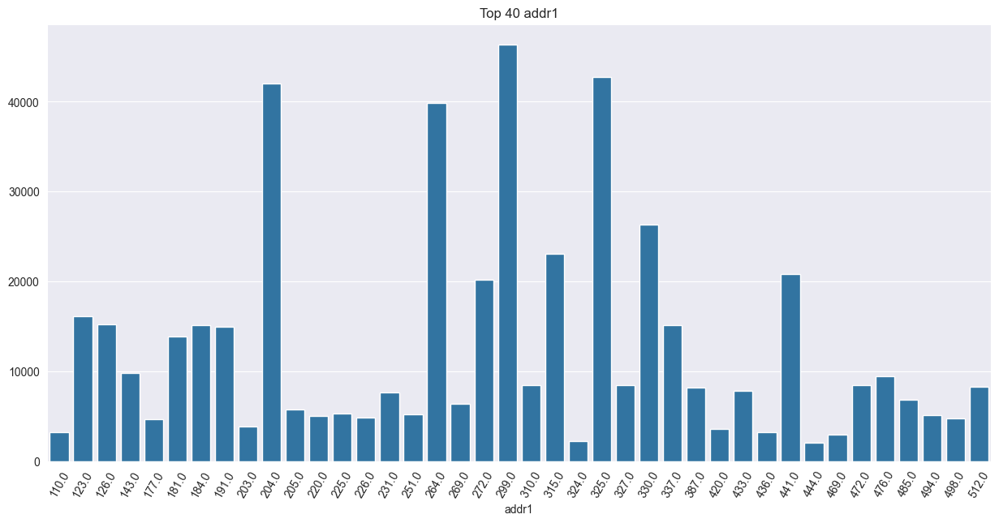

In [24]:
#Plot a Bar Chart
addr1_count = tranz['addr1'].value_counts().head(40)

plt.figure(figsize=(15, 7))
sns.set_style("darkgrid")

sns.barplot(x = addr1_count.index ,y = addr1_count.values)
plt.title('Top 40 addr1')
plt.xticks(rotation = 60)
plt.show()

In [25]:
print(len(sorted(tranz['addr2'].unique())))

print(sorted(tranz['addr2'].unique()))

75
[10.0, 87.0, nan, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 34.0, 35.0, 36.0, 38.0, 39.0, 40.0, 43.0, 44.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 54.0, 55.0, 57.0, 59.0, 60.0, 61.0, 62.0, 63.0, 65.0, 66.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 82.0, 83.0, 84.0, 86.0, 88.0, 89.0, 92.0, 93.0, 94.0, 96.0, 97.0, 98.0, 100.0, 101.0, 102.0]


<Axes: xlabel='addr2'>

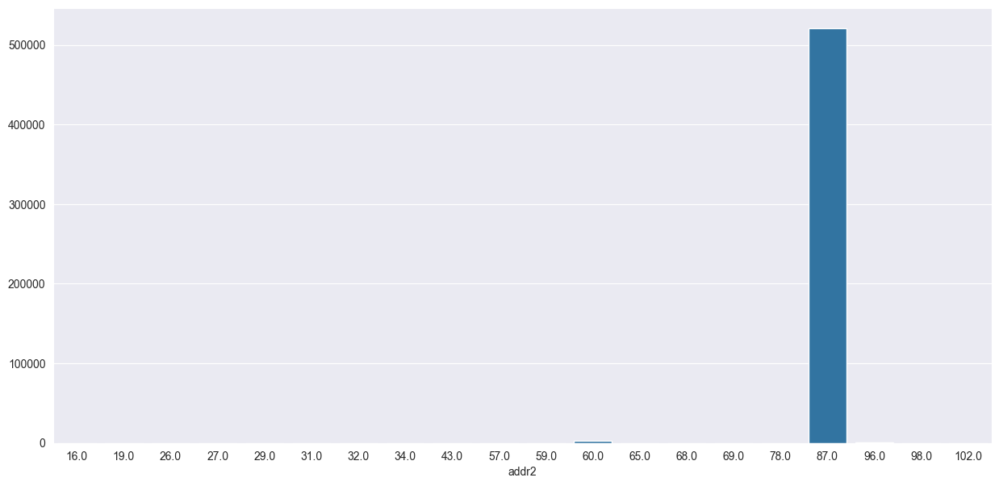

In [26]:
#Plot a Bar Chart
addr2_count = tranz['addr2'].value_counts().head(20)

plt.figure(figsize=(15, 7))
sns.set_style("darkgrid")

sns.barplot(x = addr2_count.index ,y = addr2_count.values)

In [27]:
tranz['P_emaildomain'].unique()

array([nan, 'gmail.com', 'outlook.com', 'yahoo.com', 'mail.com',
       'anonymous.com', 'hotmail.com', 'verizon.net', 'aol.com', 'me.com',
       'comcast.net', 'optonline.net', 'cox.net', 'charter.net',
       'rocketmail.com', 'prodigy.net.mx', 'embarqmail.com', 'icloud.com',
       'live.com.mx', 'gmail', 'live.com', 'att.net', 'juno.com',
       'ymail.com', 'sbcglobal.net', 'bellsouth.net', 'msn.com', 'q.com',
       'yahoo.com.mx', 'centurylink.net', 'servicios-ta.com',
       'earthlink.net', 'hotmail.es', 'cfl.rr.com', 'roadrunner.com',
       'netzero.net', 'gmx.de', 'suddenlink.net', 'frontiernet.net',
       'windstream.net', 'frontier.com', 'outlook.es', 'mac.com',
       'netzero.com', 'aim.com', 'web.de', 'twc.com', 'cableone.net',
       'yahoo.fr', 'yahoo.de', 'yahoo.es', 'sc.rr.com', 'ptd.net',
       'live.fr', 'yahoo.co.uk', 'hotmail.fr', 'hotmail.de',
       'hotmail.co.uk', 'protonmail.com', 'yahoo.co.jp'], dtype=object)

In [28]:
domnf = tranz[tranz['isFraud'] == 0]['P_emaildomain'].value_counts() #.head(15)
domf = tranz[tranz['isFraud'] == 1]['P_emaildomain'].value_counts() #.head(15)

# Create DataFrames from domnf and domf
domnf_df = domnf.reset_index(inplace = False)
domnf_df.columns = ['P_emaildomain', 'Non-Fraud Count']
domnf_df = domnf_df.sort_values(by='Non-Fraud Count')

domf_df = domf.reset_index(inplace = False)
domf_df.columns = ['P_emaildomain', 'Fraud Count']
domf_df = domf_df.sort_values(by='Fraud Count')

# Merge the two DataFrames on the P_emaildomain column
merged_df = pd.merge(domnf_df, domf_df, on='P_emaildomain', how='outer')

# Sort merged_df by descending order of 'Non-Fraud Count' and 'Fraud Count'
merged_df = merged_df.sort_values(by=['Non-Fraud Count', 'Fraud Count'], ascending=False).reset_index(drop = True)

# Display the resulting DataFrame
#merged_df

merged_df['Percentage'] = merged_df['Fraud Count']/(merged_df['Non-Fraud Count'] + merged_df['Fraud Count'])*100

merged_df['Percentage'] = merged_df['Fraud Count']/(merged_df['Non-Fraud Count'] + merged_df['Fraud Count'])*100

merged_df.sort_values(by = ['Percentage'], ascending = False).reset_index(drop = True)

,P_emaildomain,Non-Fraud Count,Fraud Count,Percentage
0,protonmail.com,45,31.0,40.789474
1,mail.com,453,106.0,18.962433
2,outlook.es,381,57.0,13.013699
3,aim.com,275,40.0,12.698413
4,outlook.com,4614,482.0,9.458399
5,hotmail.es,285,20.0,6.557377
6,live.com.mx,708,41.0,5.473965
7,hotmail.com,42854,2396.0,5.295028
8,gmail.com,218412,9943.0,4.354185
9,yahoo.fr,138,5.0,3.496503


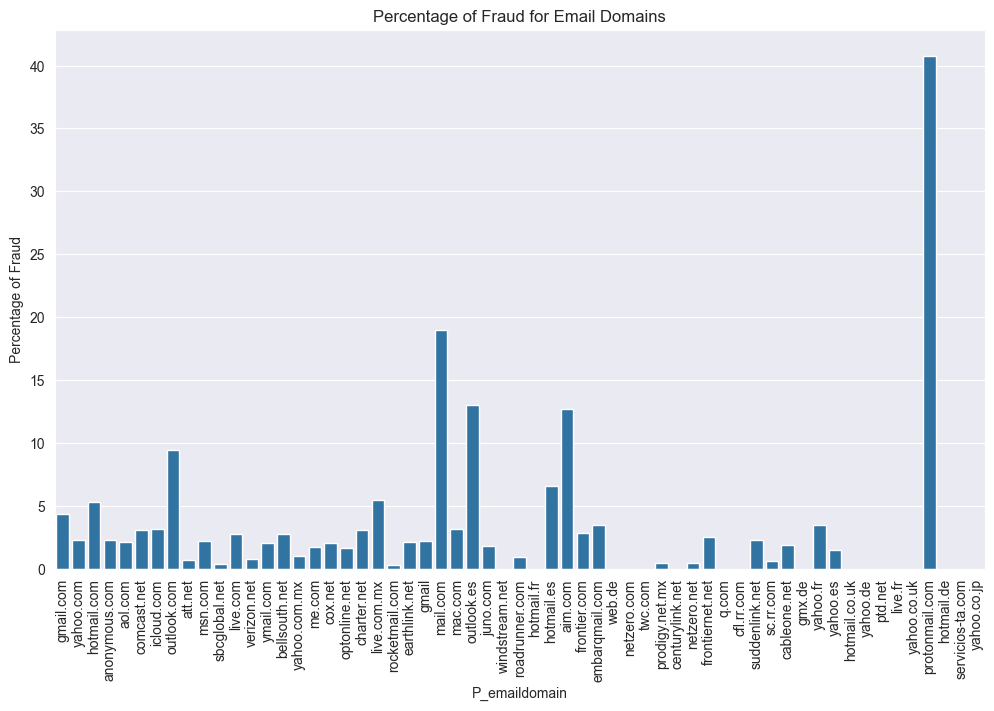

In [29]:
plt.figure(figsize = (12,7))

sns.barplot(data = merged_df, x = 'P_emaildomain', y = 'Percentage')
plt.ylabel('Percentage of Fraud')
plt.title('Percentage of Fraud for Email Domains')
plt.xticks(rotation = 90)
plt.show()

In [30]:
tranz.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,...,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,TransactionDTz,Date,Hour
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-01-02 00:00:00,2,0
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-01-02 00:00:01,2,0
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-01-02 00:01:09,2,0
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-01-02 00:01:39,2,0
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0

     Missing Values  Percentage (%)
C1                0             0.0
C2                0             0.0
C3                0             0.0
C4                0             0.0
C5                0             0.0
C6                0             0.0
C7                0             0.0
C8                0             0.0
C9                0             0.0
C10               0             0.0
C11               0             0.0
C12               0             0.0
C13               0             0.0
C14               0             0.0


Columns 50 percent of whose data is not nan :
['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']


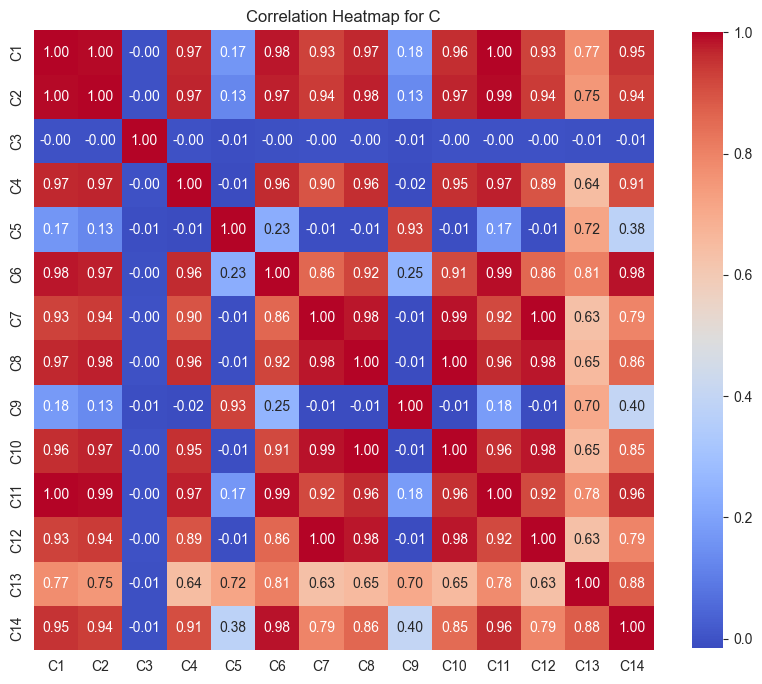



        C1  C2  C3  C4  C5  C6  C7  C8  C9  C10  C11  C12  C13  C14
0        1   1   0   0   0   1   0   0   1    0    2    0    1    1
1        1   1   0   0   0   1   0   0   0    0    1    0    1    1
2        1   1   0   0   0   1   0   0   1    0    1    0    1    1
3        2   5   0   0   0   4   0   0   1    0    1    0   25    1
4        1   1   0   0   0   1   0   1   0    1    1    0    1    1
...     ..  ..  ..  ..  ..  ..  ..  ..  ..  ...  ...  ...  ...  ...
590535   2   1   0   0   1   0   0   0   2    0    1    0    3    2
590536   1   1   0   0   0   1   0   0   1    0    1    0    1    1
590537   1   1   0   0   1   1   0   0   1    0    1    0    1    1
590538   1   1   0   0   0   3   0   0   2    0    1    1    5    1
590539   2   1   0   0   1   1   0   0   2    0    1    0    1    1

[590540 rows x 14 columns]


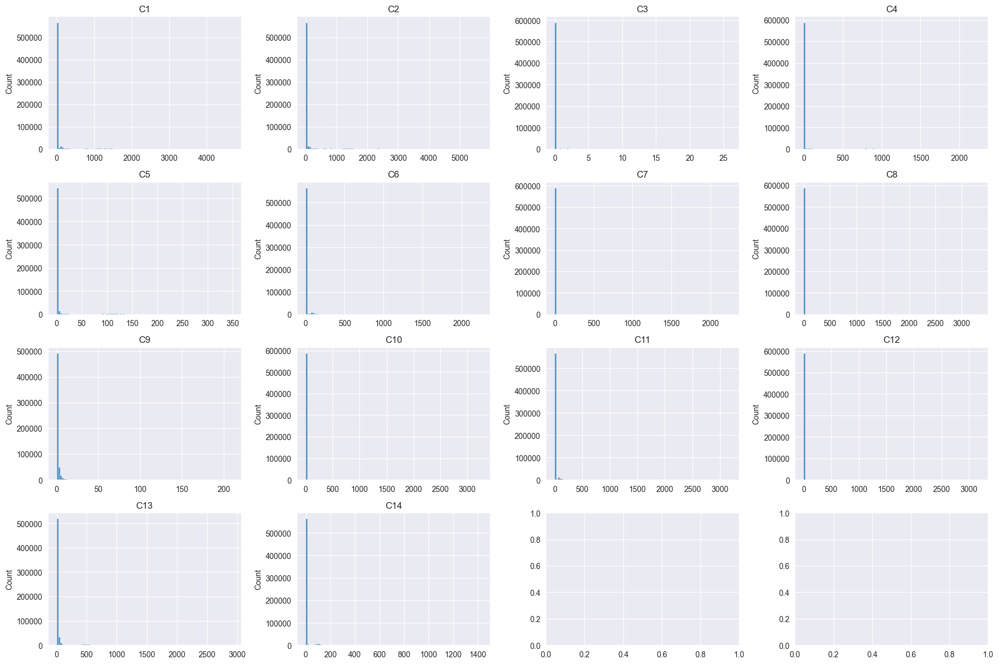

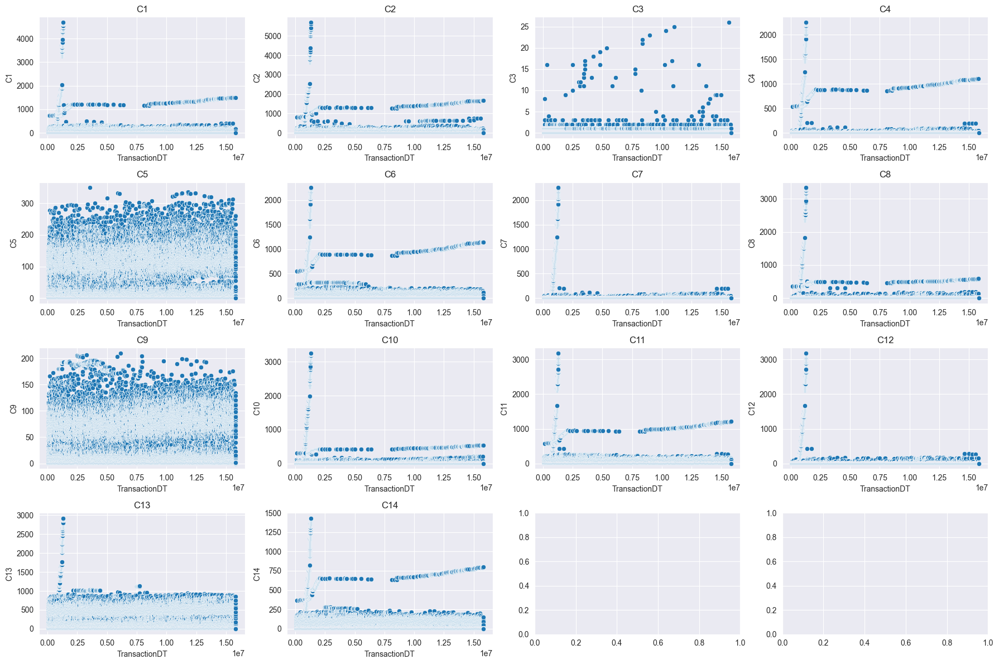

In [31]:
col_eda('C',1,14)

     Missing Values  Percentage (%)
D1             1269        0.214888
D10           76022       12.873302
D15           89113       15.090087
D4           168922       28.604667
D3           262878       44.514851
D11          279287       47.293494
D2           280797       47.549192
D5           309841       52.467403
D8           515614       87.312290
D9           515614       87.312290
D6           517353       87.606767
D12          525823       89.041047
D14          528353       89.469469
D13          528588       89.509263
D7           551623       93.409930


Columns 50 percent of whose data is not nan :
['D1', 'D2', 'D3', 'D4', 'D10', 'D11', 'D15']


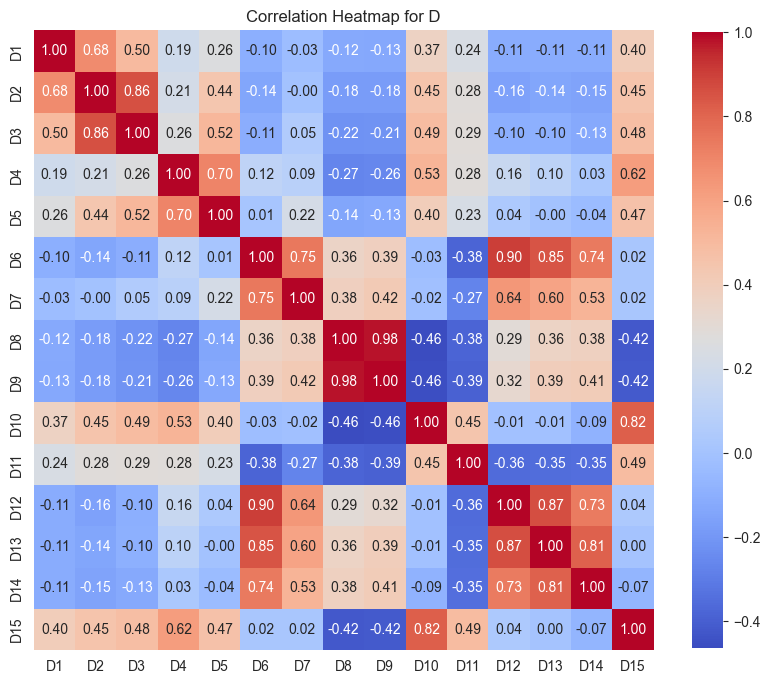



         D1   D2   D3   D4   D5   D6   D7   D8   D9  D10  D11  D12  D13  D14  \
0        14 -999   13 -999 -999 -999 -999 -999 -999   13   13 -999 -999 -999   
1         0 -999 -999    0 -999 -999 -999 -999 -999    0 -999 -999 -999 -999   
2         0 -999 -999    0 -999 -999 -999 -999 -999    0  315 -999 -999 -999   
3       112  112    0   94    0 -999 -999 -999 -999   84 -999 -999 -999 -999   
4         0 -999 -999 -999 -999 -999 -999 -999 -999 -999 -999 -999 -999 -999   
...     ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
590535   29   29   30 -999 -999 -999 -999 -999 -999   56   56 -999 -999 -999   
590536    0 -999 -999    0 -999 -999 -999 -999 -999    0    0 -999 -999 -999   
590537    0 -999 -999    0 -999 -999 -999 -999 -999    0    0 -999 -999 -999   
590538   22   22    0   22    0 -999 -999 -999 -999   22   22 -999 -999 -999   
590539    0 -999    0    1    0 -999 -999 -999 -999    1    0 -999 -999 -999   

        D15  
0         0  
1        

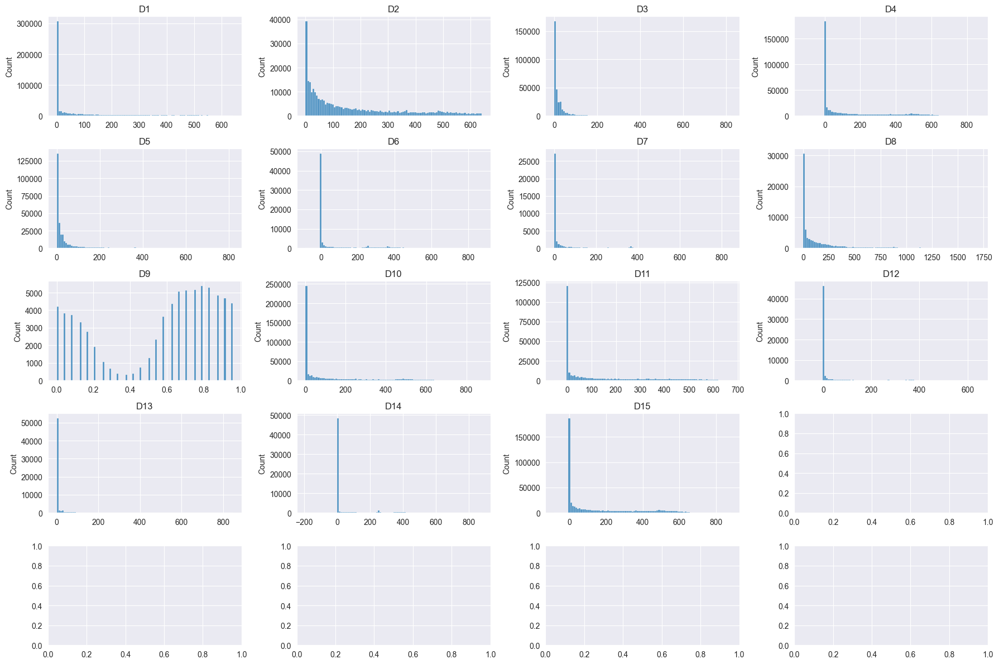

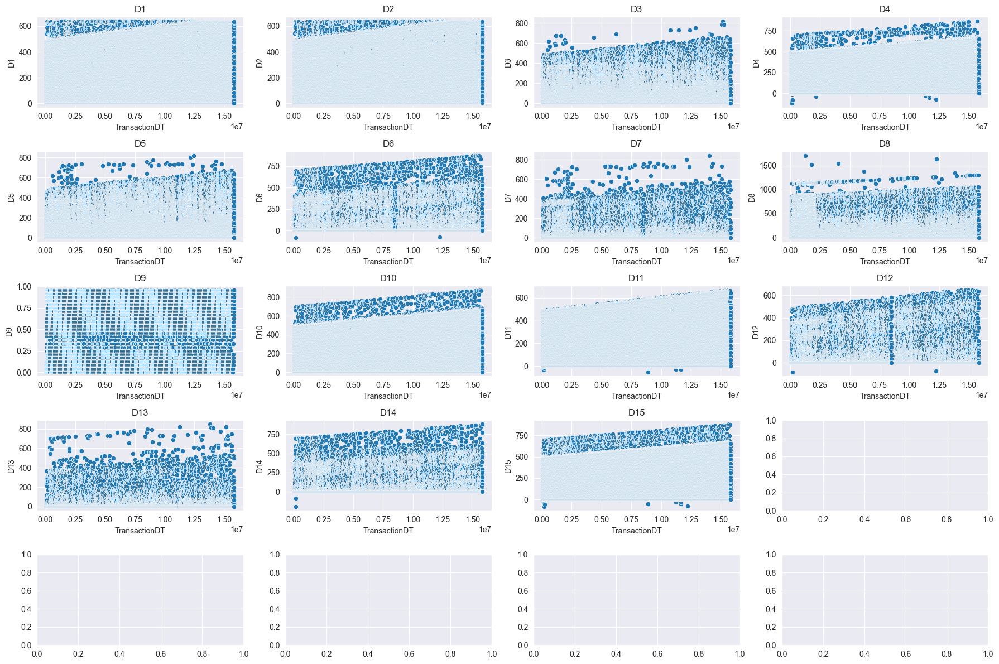

In [32]:
col_eda('D',1,15)

In [33]:
# NORMALIZE D COLUMNS
for i in range(1,16):
    #if i in [1,2,3,5,9]: continue
    tranz['D'+str(i)] =  tranz['D'+str(i)] - tranz.TransactionDT/(24*60*60) 

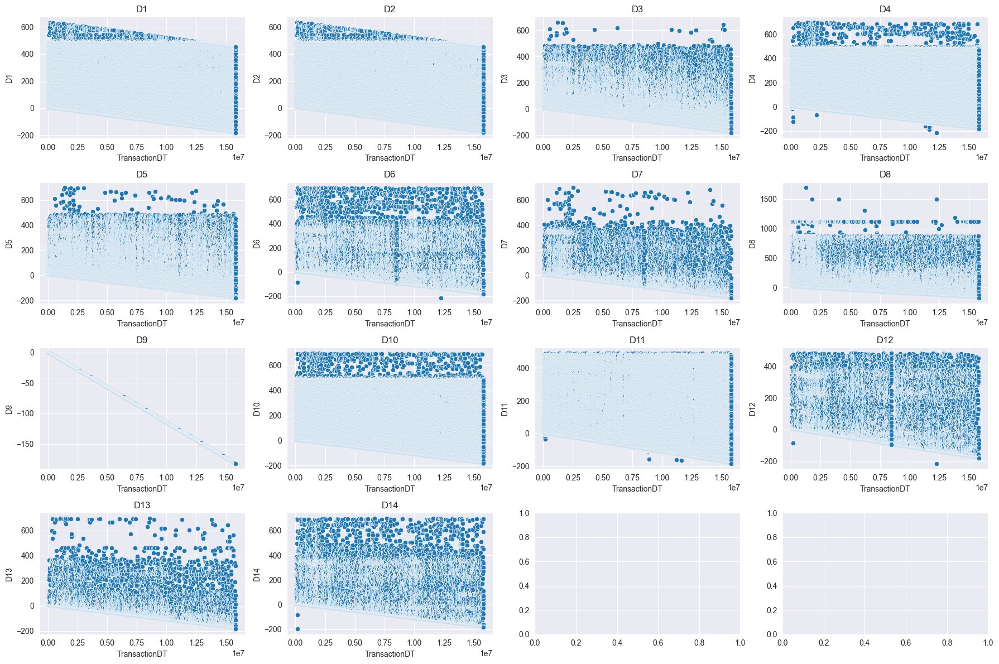

In [34]:
make_scplots('D',1,14)

In [35]:
tranz['Day'] = tranz['TransactionDTz'].dt.day

tranz['Hour'] = tranz['TransactionDTz'].dt.hour

In [36]:
tranz.head(20)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,...,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,TransactionDTz,Date,Hour,Day
0,2987000,0,86400,68.500,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,13.000000,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,NaN,12.000000,12.000000,NaN,NaN,NaN,-1.000000,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,117.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-01-02 00:00:00,2,0,2
1,2987001,0,86401,29.000,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,-1.000012,NaN,NaN,-1.000012,NaN,NaN,NaN,NaN,NaN,-1.000012,NaN,NaN,NaN,NaN,-1.000012,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-01-02 00:00:01,2,0,2
2,2987002,0,86469,59.000,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,-1.000799,NaN,NaN,-1.000799,NaN,NaN,NaN,NaN,NaN,-1.000799,313.999201,NaN,NaN,NaN,313.999201,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-01-02 00:01:09,2,0,2
3,2987003,0,86499,50.000,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,110.998854,110.998854,-1.001146,92.998854,-1.001146,NaN,NaN,NaN,NaN,82.998854,NaN,NaN,NaN,NaN,109.998854,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.000000,354.000000,0.000000,135.000000,0.000000,0.000000,0.000000,50.0,1404.0,790.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2000-01-02 00:01:39,2,0,2
4,2987004,0,86506,50.000,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,-1.001227,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

    Missing Values  Percentage (%)
M6          169360       28.678836
M1          271100       45.907136
M2          271100       45.907136
M3          271100       45.907136
M4          281444       47.658753
M8          346252       58.633115
M9          346252       58.633115
M7          346265       58.635317
M5          350482       59.349409


Columns 50 percent of whose data is not nan :
['M1', 'M2', 'M3', 'M4', 'M6']


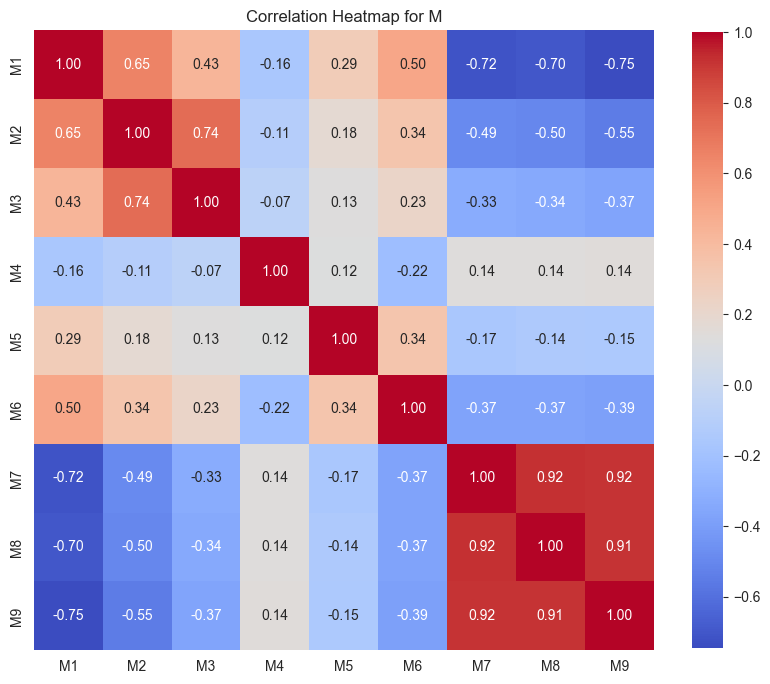



        M1  M2  M3  M4  M5  M6  M7  M8  M9
0        0   0   0   0   0   0   0   0   0
1        1   1   1   1   1   0   0   0   0
2        0   0   0   1   0   1   1   1   1
3        1   1   1   1   1   1   0   0   0
4        1   1   1   2   2   2   0   0   0
...     ..  ..  ..  ..  ..  ..  ..  ..  ..
590535   0   0   0   1   1   1   1   1   2
590536   0   2   2   1   0   0   1   1   1
590537   0   2   2   2   2   0   0   0   0
590538   0   0   0   1   0   0   0   0   0
590539   0   2   2   2   2   0   1   1   1

[590540 rows x 9 columns]


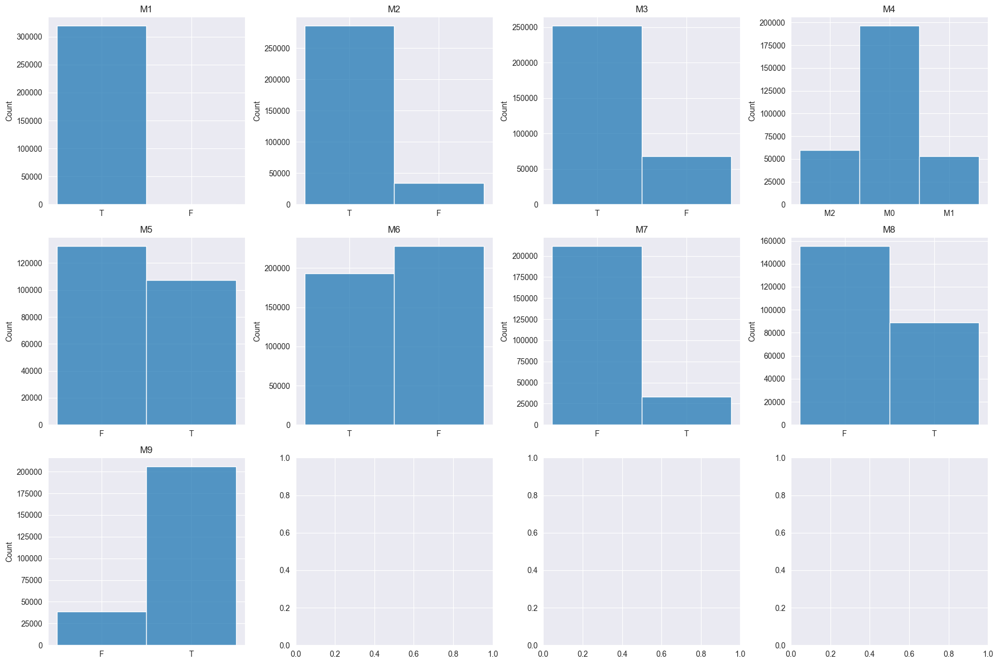

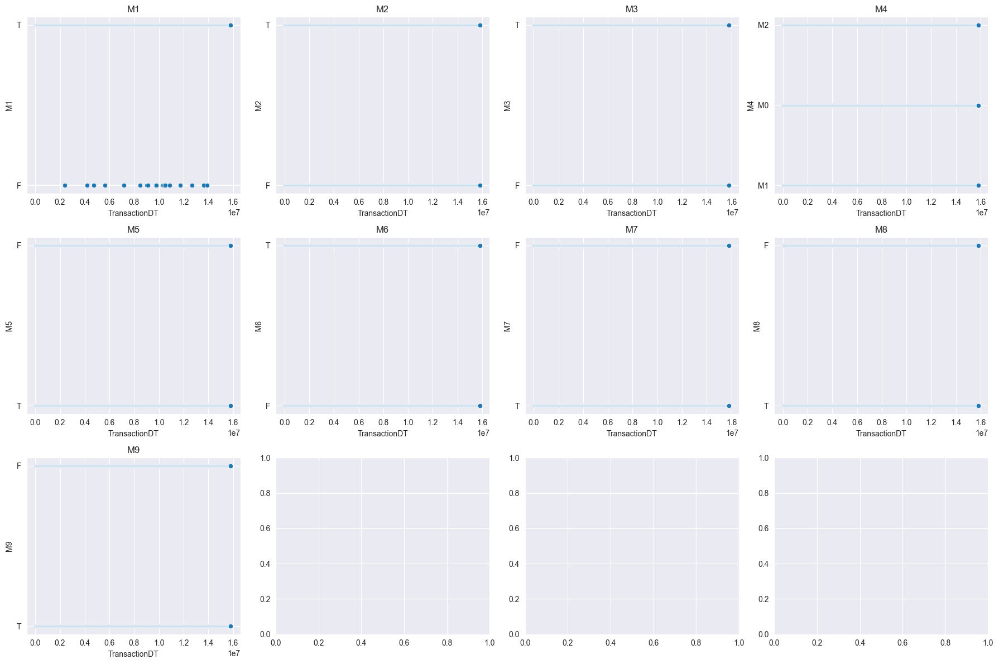

In [37]:
col_eda('M',1,9)

In [38]:
tranz_nan = tranz.isna().sum().reset_index()
tranz_nan.columns = ['col','nans']
tranz_nan

,col,nans
0,TransactionID,0
1,isFraud,0
2,TransactionDT,0
3,TransactionAmt,0
4,ProductCD,0
...,...,...
433,DeviceInfo,471874
434,TransactionDTz,0
435,Date,0
436,Hour,0


In [39]:
tranz_nan_grp = tranz_nan.groupby('nans')['col'].apply(list).reset_index()
tranz_nan_grp['number of cols'] = tranz_nan_grp['col'].apply(len)

tranz_nan_grp

,nans,col,number of cols
0,0,"[TransactionID, isFraud, TransactionDT, Transa...",24
1,12,"[V279, V280, V284, V285, V286, V287, V290, V29...",32
2,314,"[V95, V96, V97, V98, V99, V100, V101, V102, V1...",43
3,1269,"[D1, V281, V282, V283, V288, V289, V296, V300,...",12
4,1565,[card3],1
...,...,...,...
65,585377,[id_26],1
66,585381,[id_21],1
67,585385,"[id_07, id_08]",2
68,585408,[id_25],1


In [40]:
tranz_nan_v = tranz_nan_grp[tranz_nan_grp['col'].apply(lambda cols: any(str(col).startswith('V') for col in cols))].reset_index(drop=True)
tranz_nan_v

,nans,col,number of cols
0,12,"[V279, V280, V284, V285, V286, V287, V290, V29...",32
1,314,"[V95, V96, V97, V98, V99, V100, V101, V102, V1...",43
2,1269,"[D1, V281, V282, V283, V288, V289, V296, V300,...",12
3,76073,"[V12, V13, V14, V15, V16, V17, V18, V19, V20, ...",23
4,77096,"[V53, V54, V55, V56, V57, V58, V59, V60, V61, ...",22
5,89164,"[V75, V76, V77, V78, V79, V80, V81, V82, V83, ...",20
6,168969,"[V35, V36, V37, V38, V39, V40, V41, V42, V43, ...",18
7,279287,"[D11, V1, V2, V3, V4, V5, V6, V7, V8, V9, V10,...",12
8,449124,"[V220, V221, V222, V227, V234, V238, V239, V24...",16
9,450721,"[V169, V170, V171, V174, V175, V180, V184, V18...",19


In [41]:
for idx, cols in enumerate(tranz_nan_v['col']):
    print(f'Group {idx+1} = {cols}')

Group 1 = ['V279', 'V280', 'V284', 'V285', 'V286', 'V287', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V297', 'V298', 'V299', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321']
Group 2 = ['V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137']
Group 3 = ['D1', 'V281', 'V282', 'V283', 'V288', 'V289', 'V296', 'V300', 'V301', 'V313', 'V314', 'V315']
Group 4 = ['V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34']
Group 5 = ['V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66

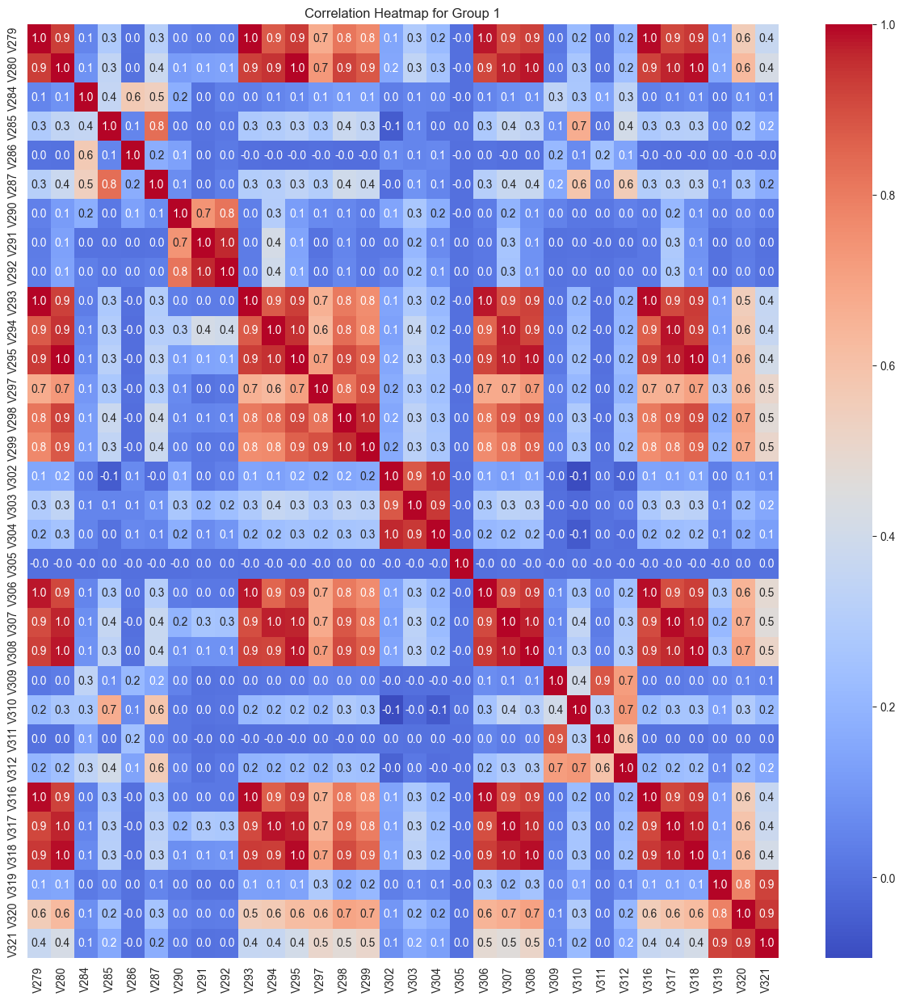

cols = ['V279', 'V280', 'V284', 'V285', 'V286', 'V287', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V297', 'V298', 'V299', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321']
reduced cols =  ['V279', 'V284', 'V285', 'V286', 'V290', 'V302', 'V305', 'V309', 'V310', 'V319']


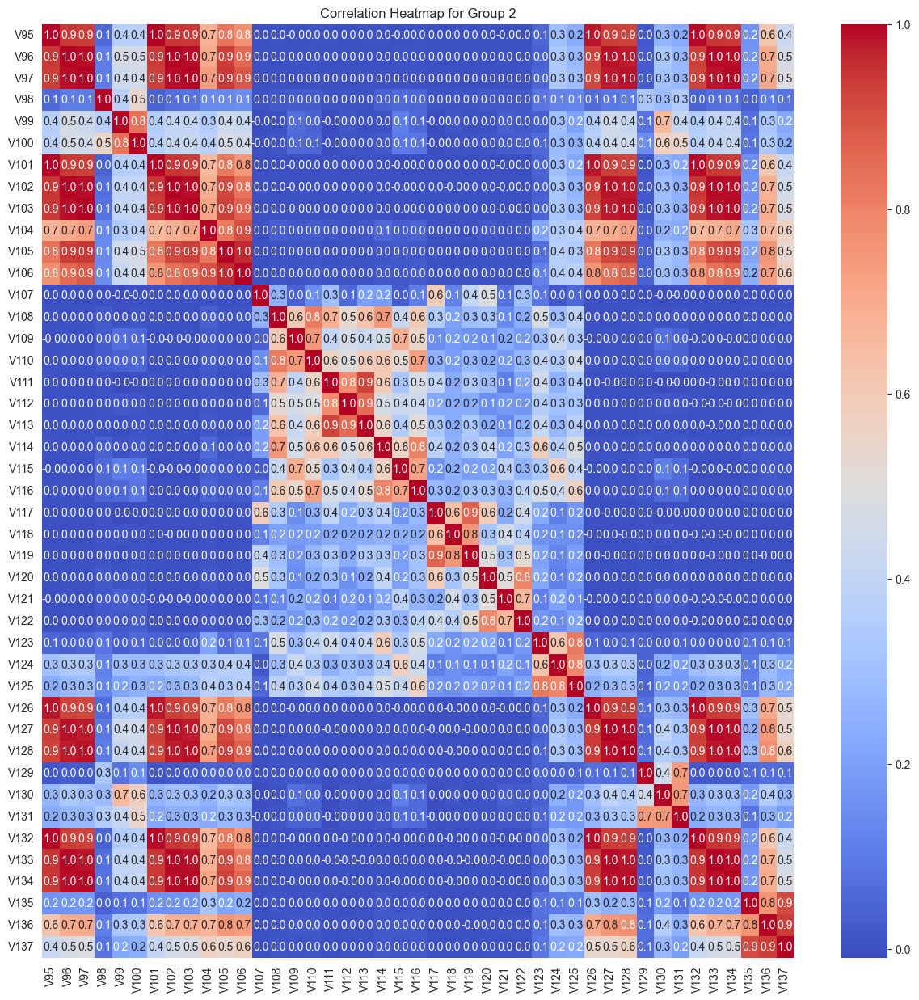

cols = ['V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137']
reduced cols =  ['V95', 'V98', 'V99', 'V107', 'V108', 'V109', 'V111', 'V115', 'V117', 'V118', 'V120', 'V121', 'V123', 'V124', 'V129', 'V130', 'V135']


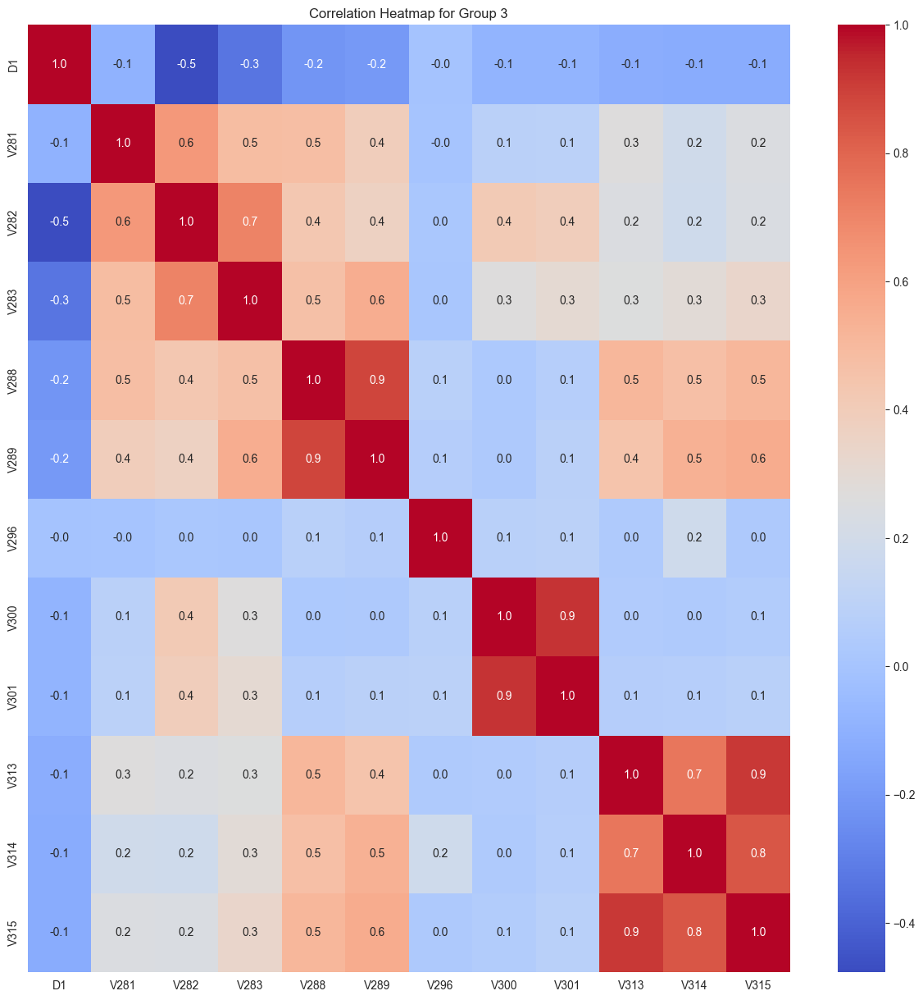

cols = ['D1', 'V281', 'V282', 'V283', 'V288', 'V289', 'V296', 'V300', 'V301', 'V313', 'V314', 'V315']
reduced cols =  ['D1', 'V281', 'V282', 'V288', 'V296', 'V300', 'V313']


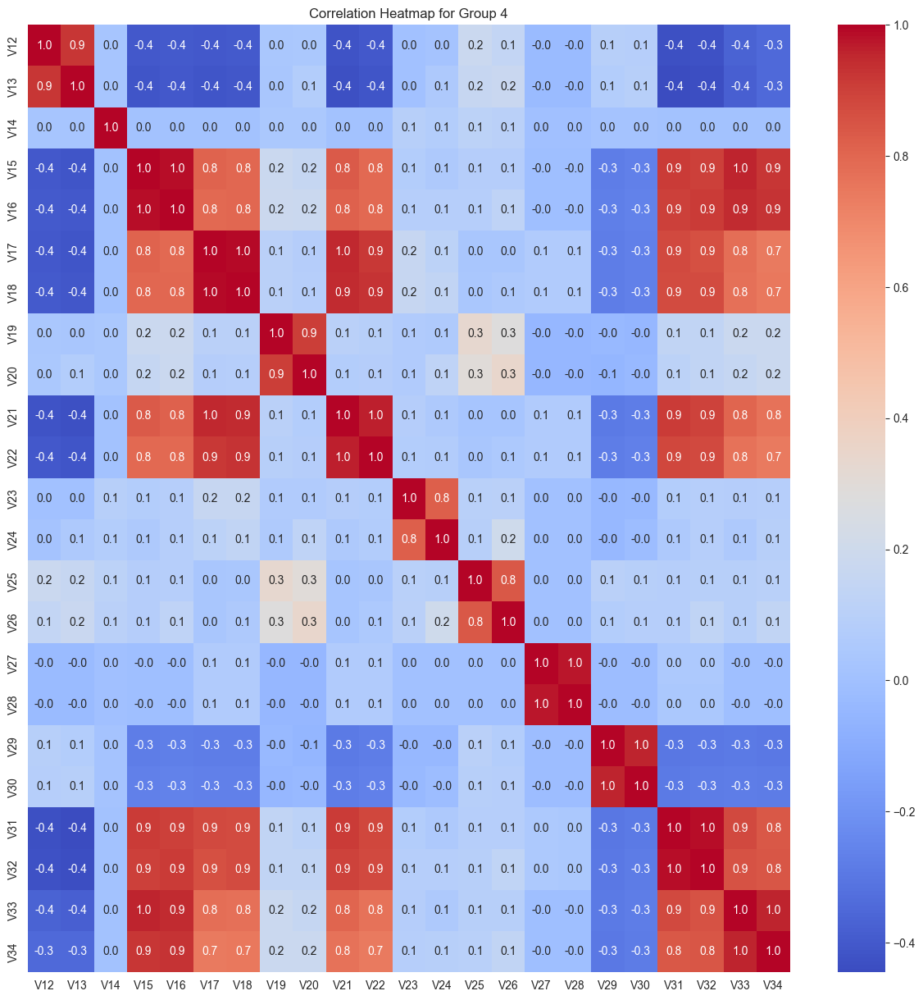

cols = ['V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34']
reduced cols =  ['V12', 'V14', 'V15', 'V19', 'V23', 'V25', 'V27', 'V29']


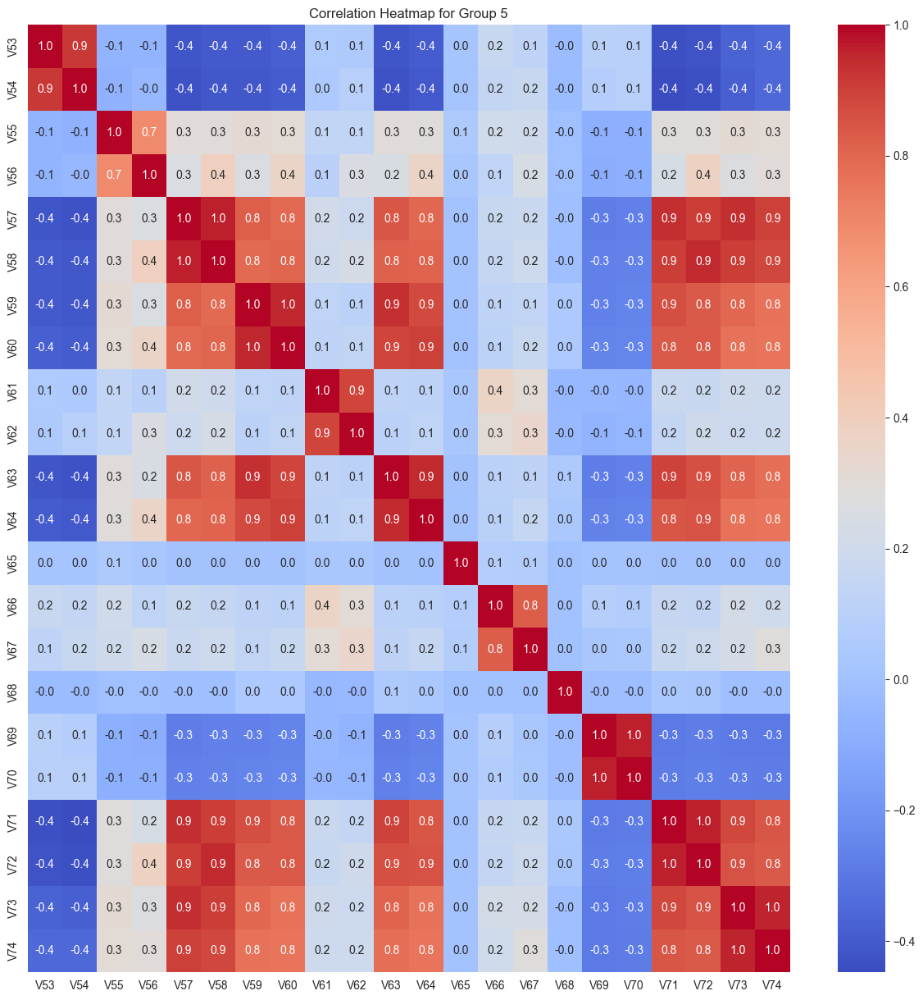

cols = ['V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74']
reduced cols =  ['V53', 'V55', 'V56', 'V57', 'V61', 'V65', 'V66', 'V68', 'V69']


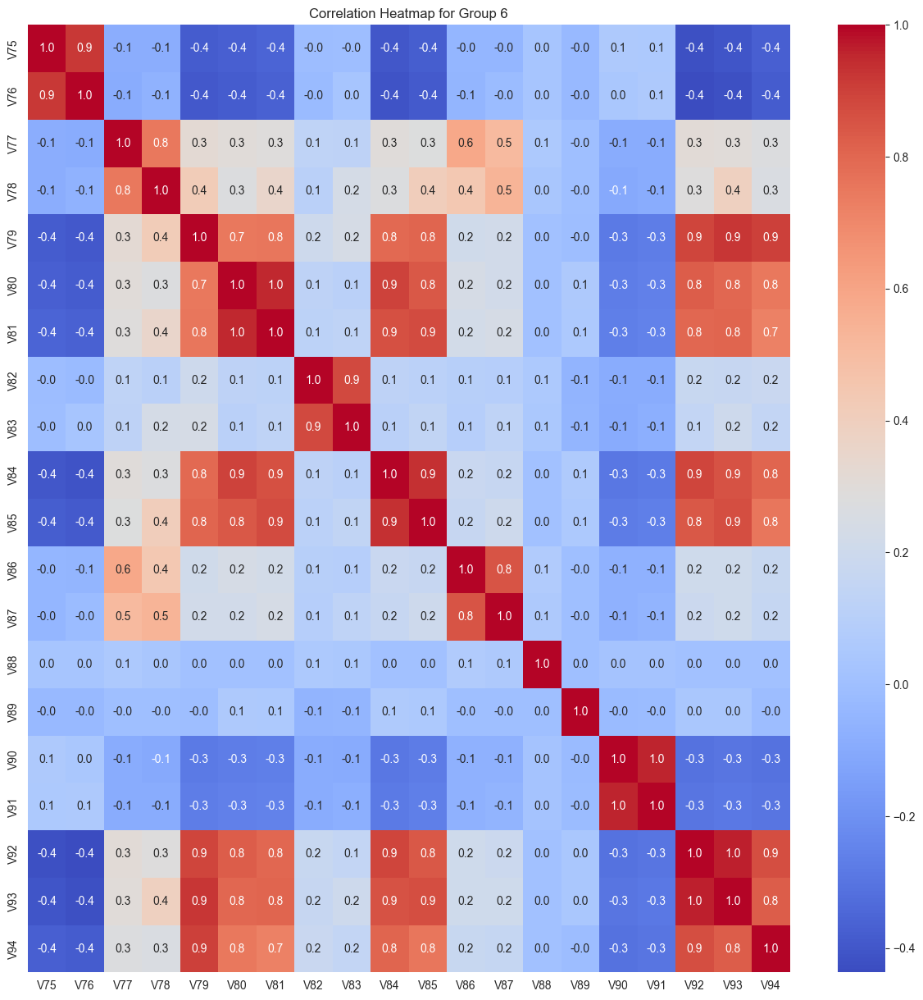

cols = ['V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94']
reduced cols =  ['V75', 'V77', 'V79', 'V82', 'V86', 'V88', 'V89', 'V90']


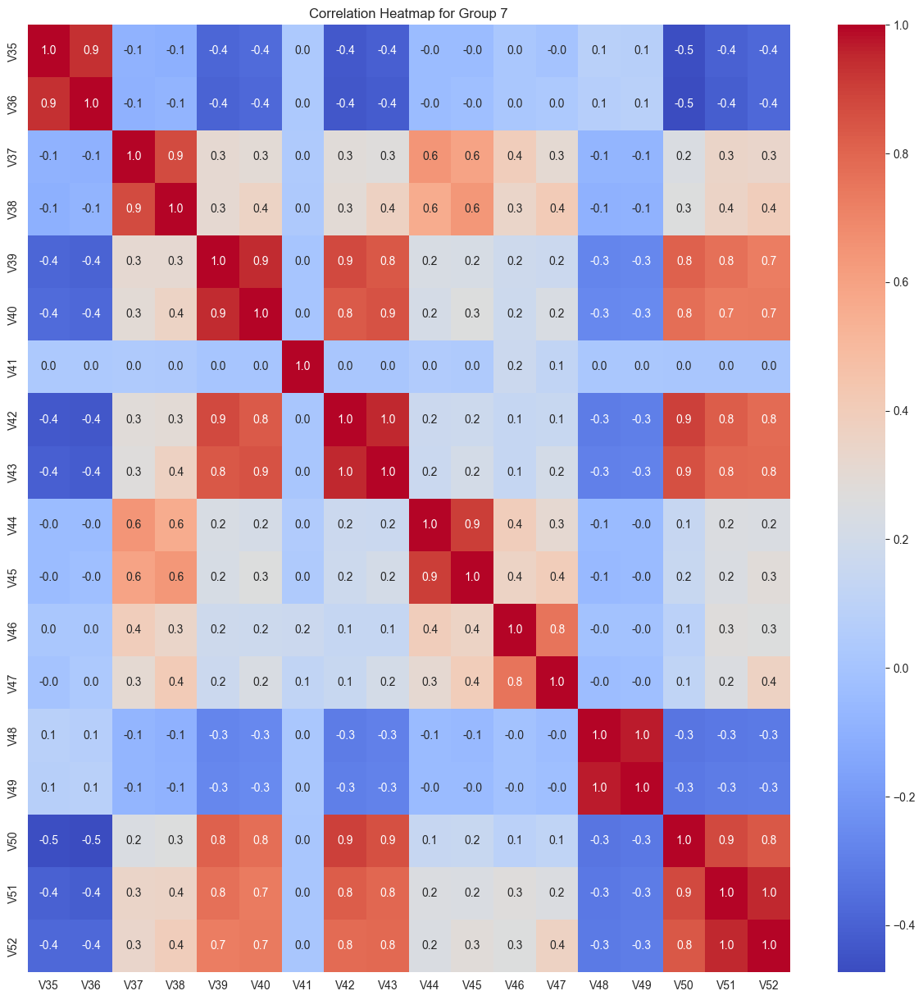

cols = ['V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52']
reduced cols =  ['V35', 'V37', 'V39', 'V41', 'V44', 'V46', 'V48']


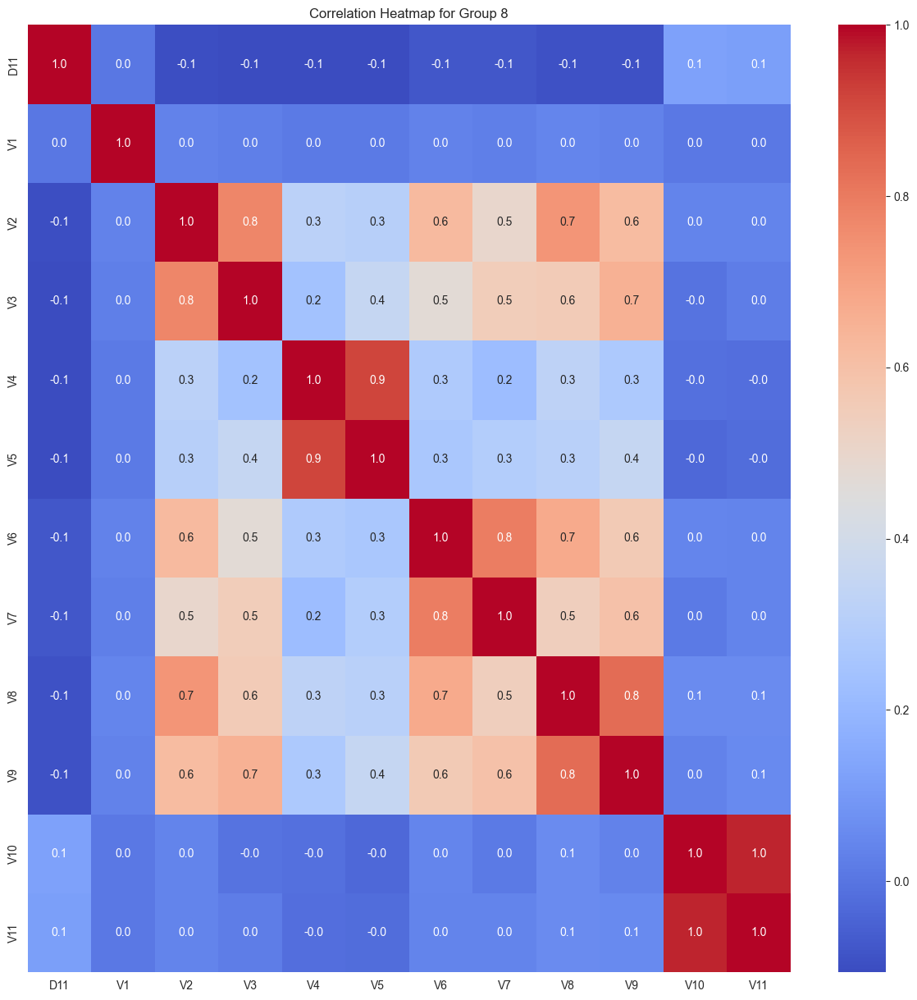

cols = ['D11', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11']
reduced cols =  ['D11', 'V1', 'V2', 'V4', 'V6', 'V10']


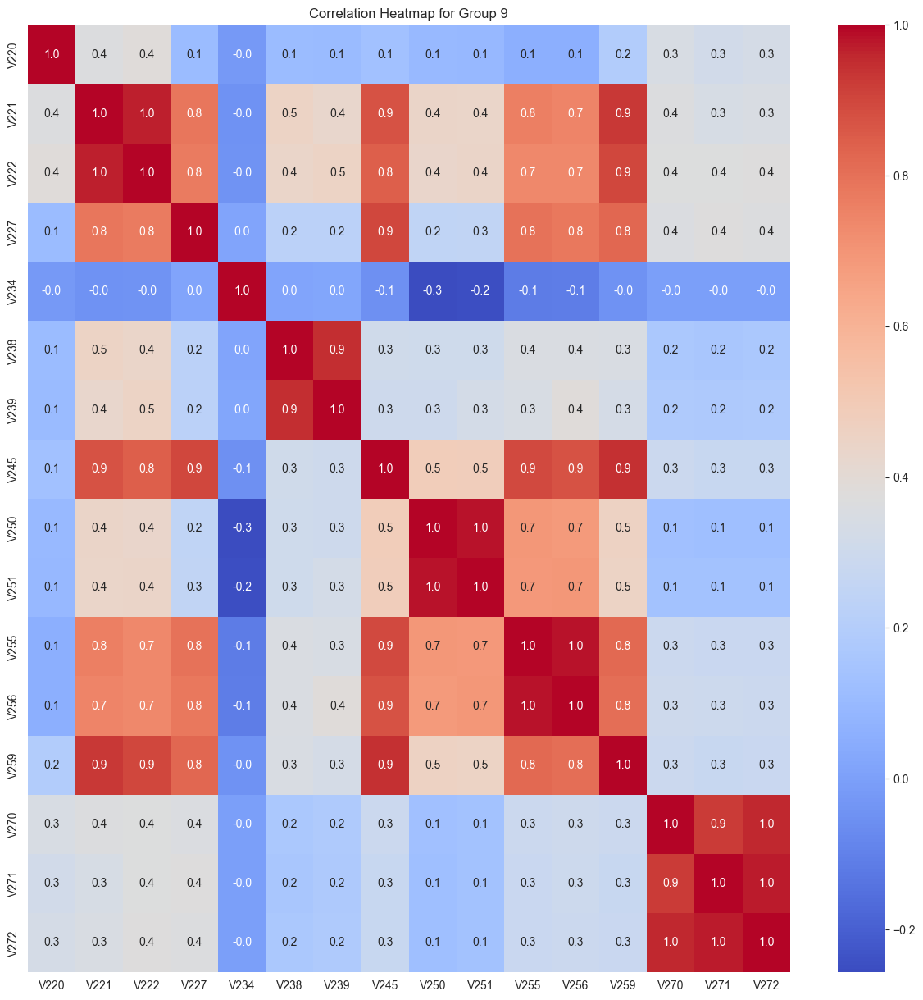

cols = ['V220', 'V221', 'V222', 'V227', 'V234', 'V238', 'V239', 'V245', 'V250', 'V251', 'V255', 'V256', 'V259', 'V270', 'V271', 'V272']
reduced cols =  ['V220', 'V221', 'V234', 'V238', 'V250', 'V270']


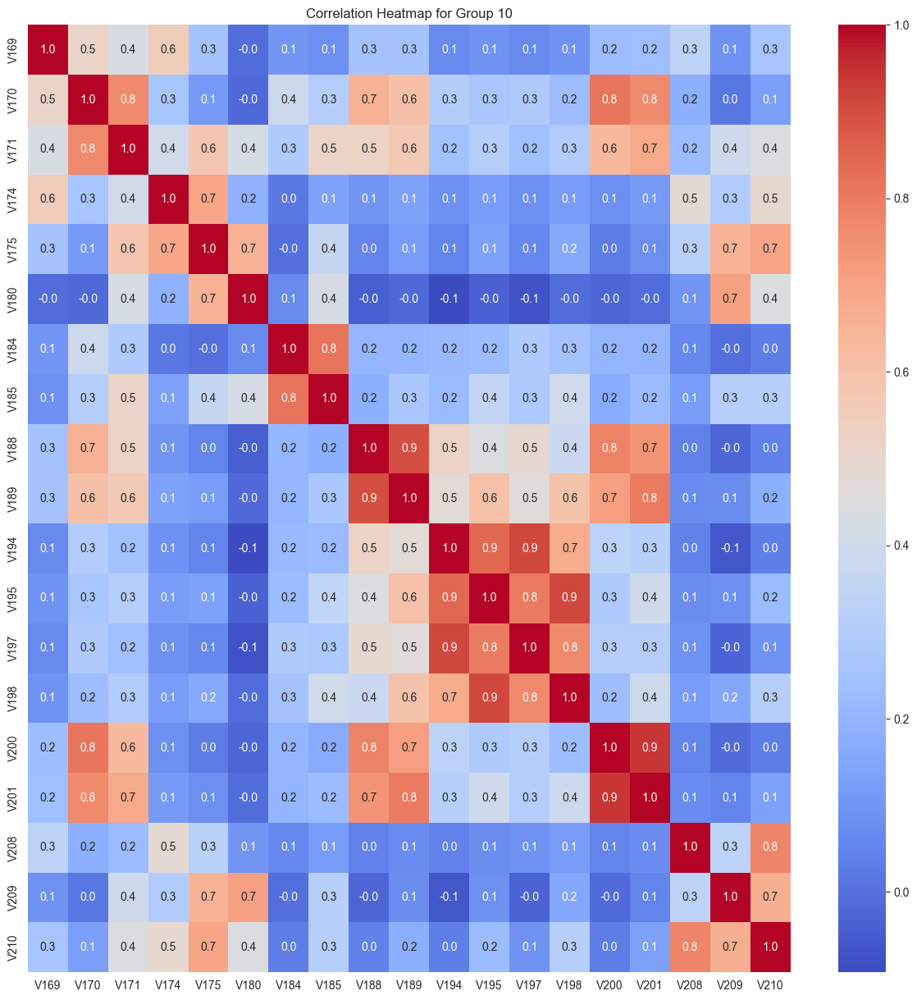

cols = ['V169', 'V170', 'V171', 'V174', 'V175', 'V180', 'V184', 'V185', 'V188', 'V189', 'V194', 'V195', 'V197', 'V198', 'V200', 'V201', 'V208', 'V209', 'V210']
reduced cols =  ['V169', 'V170', 'V174', 'V175', 'V180', 'V184', 'V188', 'V194', 'V208']


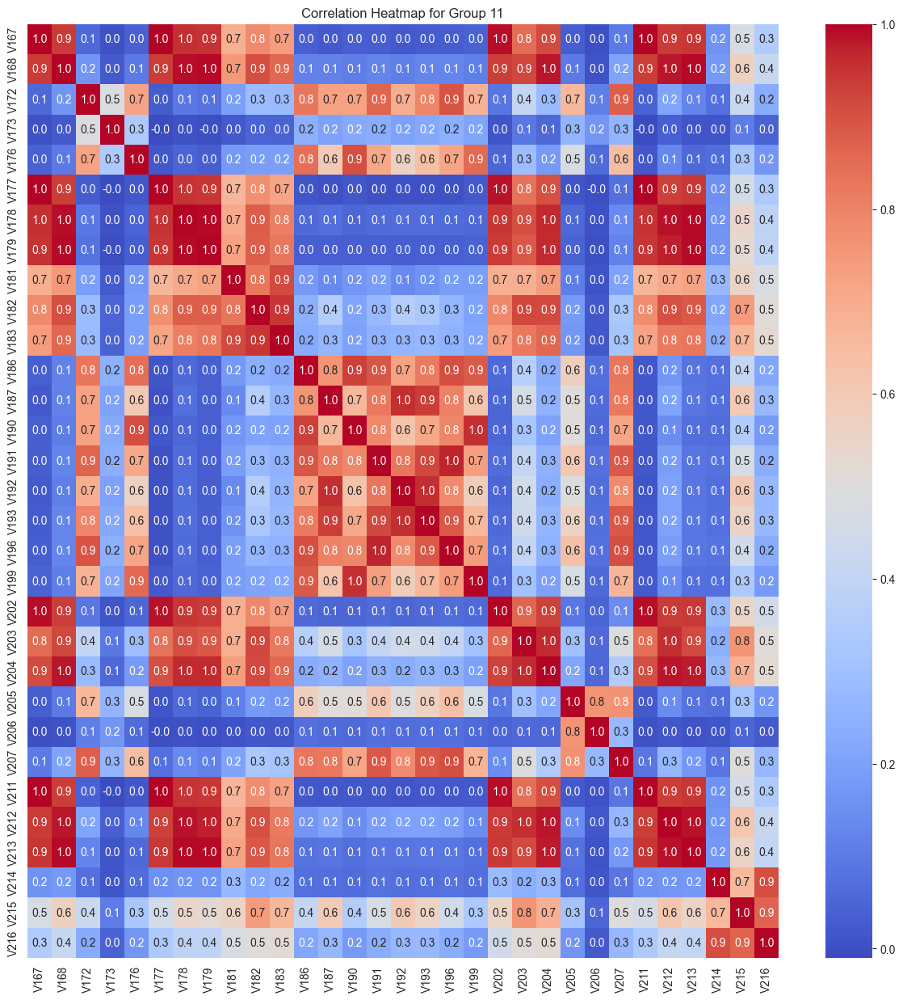

cols = ['V167', 'V168', 'V172', 'V173', 'V176', 'V177', 'V178', 'V179', 'V181', 'V182', 'V183', 'V186', 'V187', 'V190', 'V191', 'V192', 'V193', 'V196', 'V199', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216']
reduced cols =  ['V167', 'V172', 'V173', 'V205', 'V214']


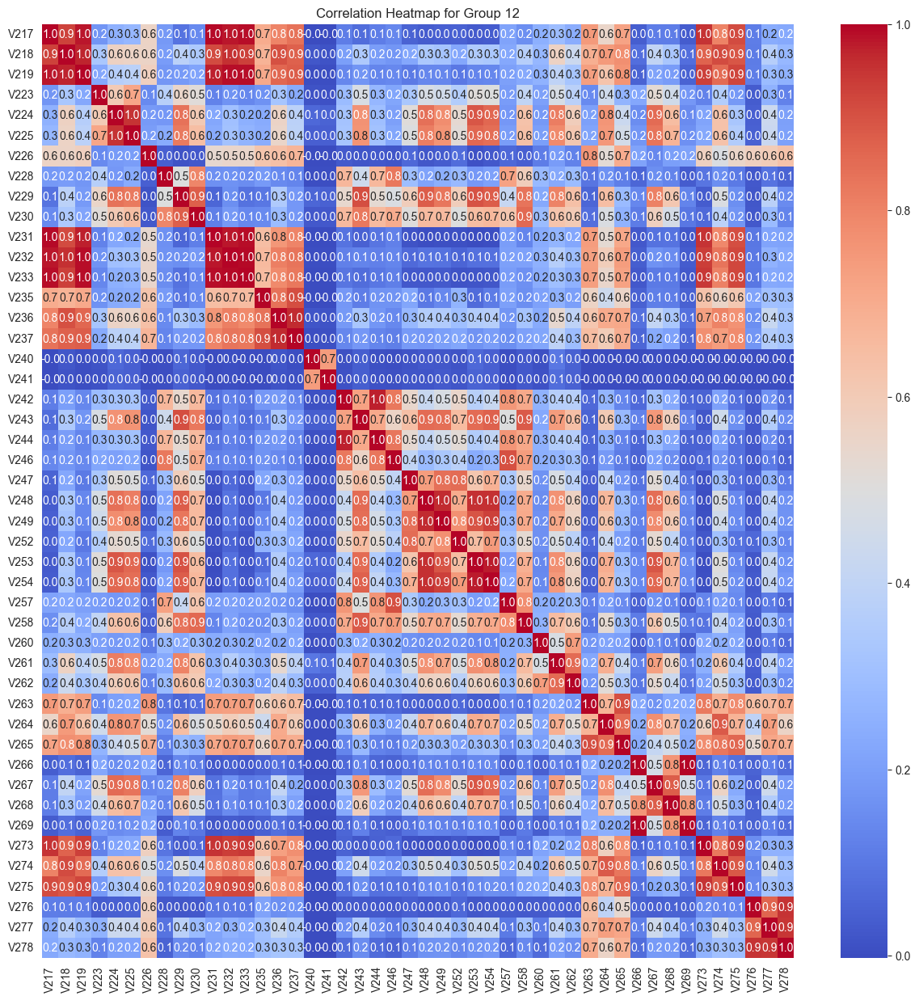

cols = ['V217', 'V218', 'V219', 'V223', 'V224', 'V225', 'V226', 'V228', 'V229', 'V230', 'V231', 'V232', 'V233', 'V235', 'V236', 'V237', 'V240', 'V241', 'V242', 'V243', 'V244', 'V246', 'V247', 'V248', 'V249', 'V252', 'V253', 'V254', 'V257', 'V258', 'V260', 'V261', 'V262', 'V263', 'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278']
reduced cols =  ['V217', 'V223', 'V224', 'V226', 'V228', 'V240', 'V242', 'V247', 'V260', 'V266', 'V276']


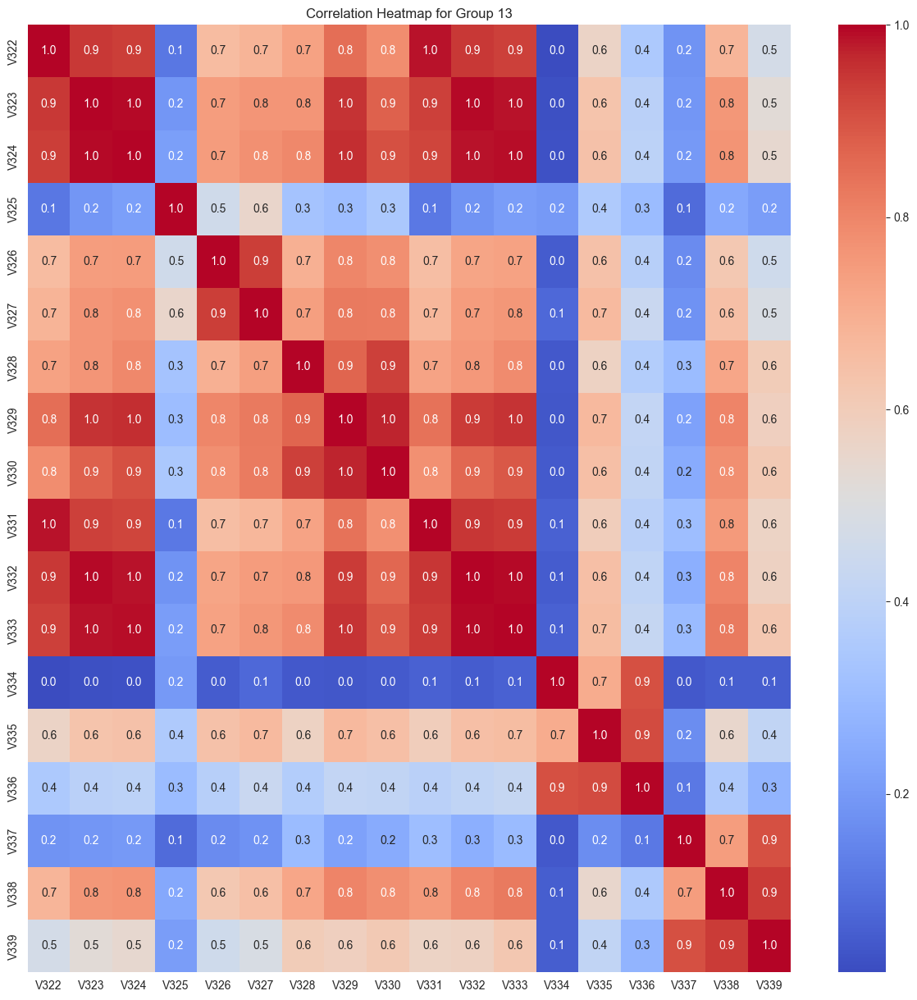

cols = ['V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339']
reduced cols =  ['V322', 'V325', 'V334', 'V337']


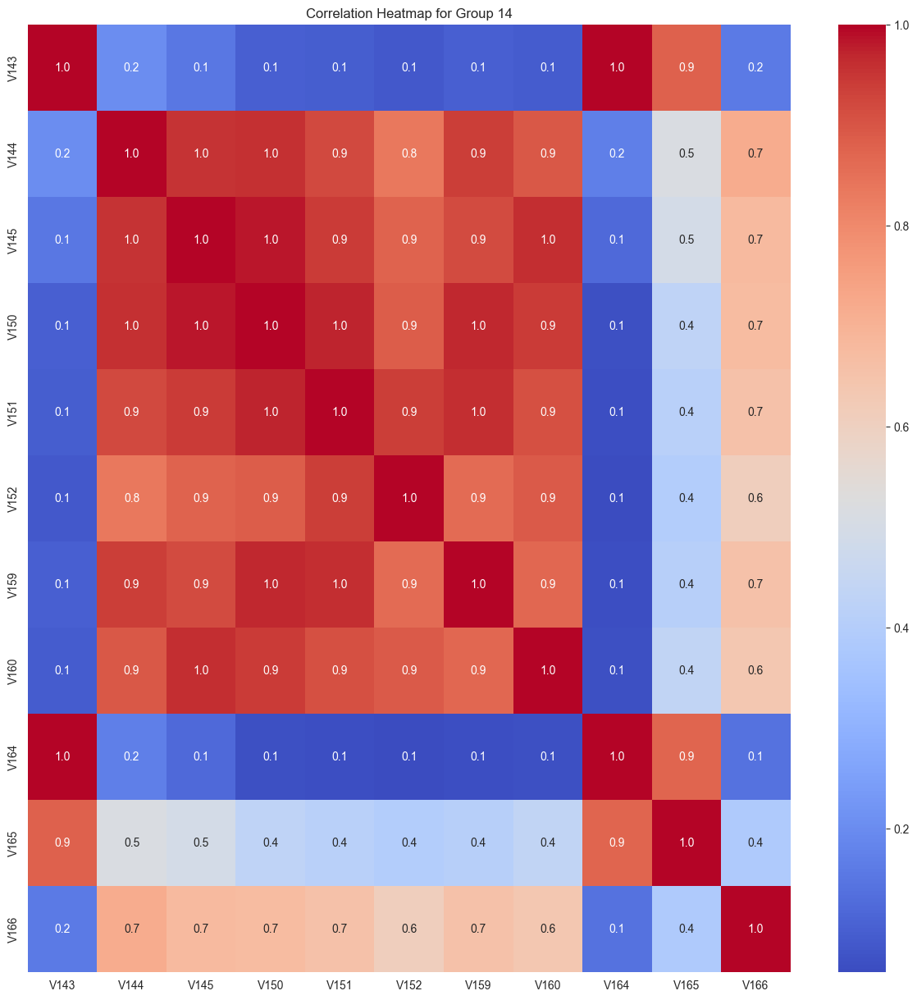

cols = ['V143', 'V144', 'V145', 'V150', 'V151', 'V152', 'V159', 'V160', 'V164', 'V165', 'V166']
reduced cols =  ['V143', 'V144']


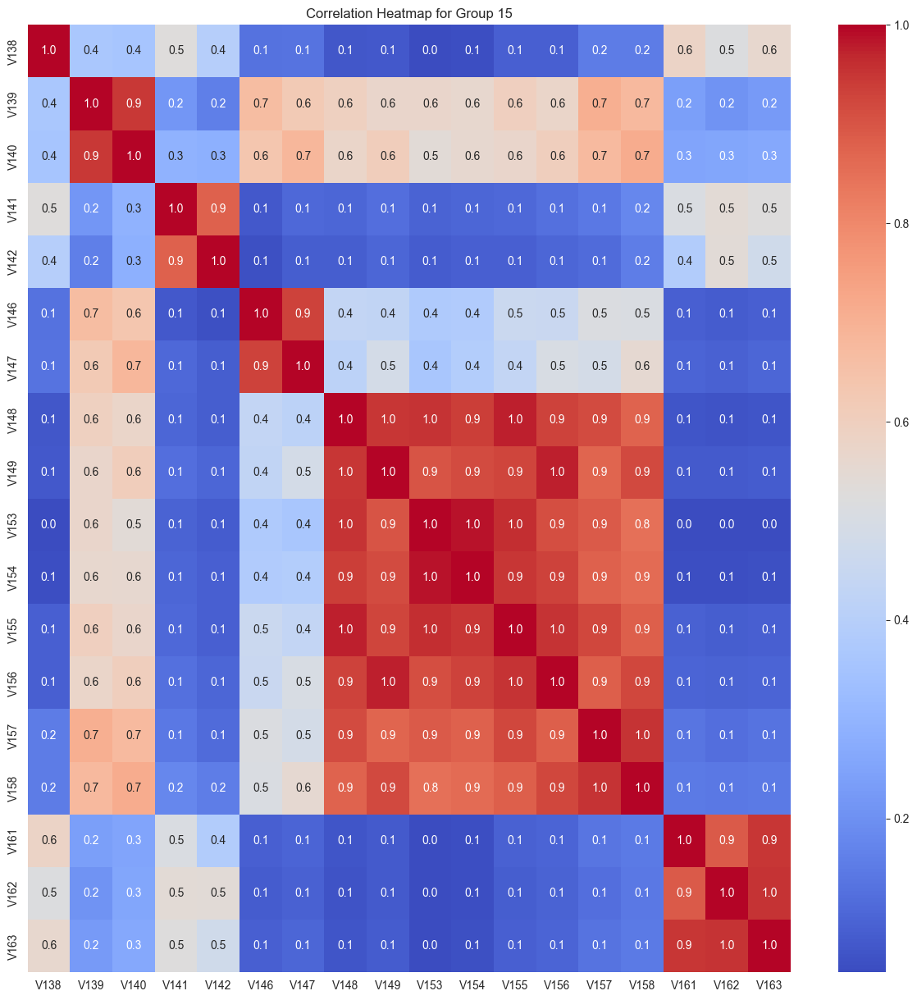

cols = ['V138', 'V139', 'V140', 'V141', 'V142', 'V146', 'V147', 'V148', 'V149', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V161', 'V162', 'V163']
reduced cols =  ['V138', 'V139', 'V141', 'V146', 'V148', 'V161']
All V columns after reduction:
 ['V279', 'V284', 'V285', 'V286', 'V290', 'V302', 'V305', 'V309', 'V310', 'V319', 'V95', 'V98', 'V99', 'V107', 'V108', 'V109', 'V111', 'V115', 'V117', 'V118', 'V120', 'V121', 'V123', 'V124', 'V129', 'V130', 'V135', 'D1', 'V281', 'V282', 'V288', 'V296', 'V300', 'V313', 'V12', 'V14', 'V15', 'V19', 'V23', 'V25', 'V27', 'V29', 'V53', 'V55', 'V56', 'V57', 'V61', 'V65', 'V66', 'V68', 'V69', 'V75', 'V77', 'V79', 'V82', 'V86', 'V88', 'V89', 'V90', 'V35', 'V37', 'V39', 'V41', 'V44', 'V46', 'V48', 'D11', 'V1', 'V2', 'V4', 'V6', 'V10', 'V220', 'V221', 'V234', 'V238', 'V250', 'V270', 'V169', 'V170', 'V174', 'V175', 'V180', 'V184', 'V188', 'V194', 'V208', 'V167', 'V172', 'V173', 'V205', 'V214', 'V217', 'V223', 'V224', 'V226', 'V228', 'V240', 'V242', 'V247

In [42]:
v_red_col = []

for idx, cols in enumerate(tranz_nan_v['col']):
    df = tranz[cols]
    corr = df.corr()
    plt.figure(figsize=(15, 15))
    
    sns.heatmap(corr, annot=True, fmt='.1f', cmap='coolwarm')
    plt.title(f'Correlation Heatmap for Group {idx+1}')
    plt.show()

    corr_matrix = df.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] >= 0.7)]

    red_col = [col for col in cols if col not in to_drop]
    

    v_red_col.extend(red_col)

    print(f'cols = {cols}')
    print('reduced cols = ',red_col)

print('All V columns after reduction:\n',v_red_col)

In [43]:
v_red_col_sorted = sorted(v_red_col, key=lambda x: int(''.join(filter(str.isdigit, x))))

In [44]:
v_red_col_sorted_v = [col for col in v_red_col_sorted if col.startswith('V')]
len(v_red_col_sorted_v)

113

In [45]:
V = tranz[v_red_col_sorted_v]
V.head()

,V1,V2,V4,V6,V10,V12,V14,V15,V19,V23,V25,V27,V29,V35,V37,V39,V41,V44,V46,V48,V53,V55,V56,V57,V61,V65,V66,V68,V69,V75,V77,V79,V82,V86,V88,V89,V90,V95,V98,V99,V107,V108,V109,V111,V115,V117,V118,V120,V121,V123,V124,V129,V130,V135,V138,V139,V141,V143,V144,V146,V148,V161,V167,V169,V170,V172,V173,V174,V175,V180,V184,V188,V194,V205,V208,V214,V217,V220,V221,V223,V224,V226,V228,V234,V238,V240,V242,V247,V250,V260,V266,V270,V276,V279,V281,V282,V284,V285,V286,V288,V290,V296,V300,V302,V305,V309,V310,V313,V319,V322,V325,V334,V337
0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,354.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,10.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,354.0,0.0,0.0,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,18.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<Axes: >

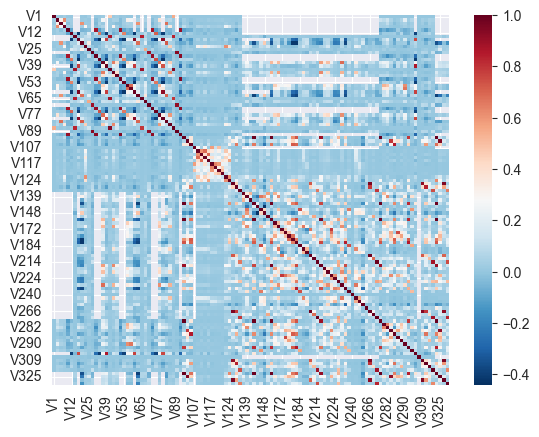

In [46]:
V_corr = V.corr()

sns.heatmap(V_corr, cmap = 'RdBu_r')

In [47]:
# Keep only V columns in v_red_col_sorted_v, plus all non-V columns
v_cols_to_keep = set(v_red_col_sorted_v)
non_v_cols = [col for col in tranz.columns if not col.startswith('V')]
tranz = tranz[non_v_cols + v_red_col_sorted_v]

In [48]:
tranz

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,...,V98,V99,V107,V108,V109,V111,V115,V117,V118,V120,V121,V123,V124,V129,V130,V135,V138,V139,V141,V143,V144,V146,V148,V161,V167,V169,V170,V172,V173,V174,V175,V180,V184,V188,V194,V205,V208,V214,V217,V220,V221,V223,V224,V226,V228,V234,V238,V240,V242,V247,V250,V260,V266,V270,V276,V279,V281,V282,V284,V285,V286,V288,V290,V296,V300,V302,V305,V309,V310,V313,V319,V322,V325,V334,V337
0,2987000,0,86400,68.50,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,13.000000,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,NaN,12.000000,12.000000,NaN,NaN,NaN,-1.000000,T,T,T,M2,F,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.00,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,-1.000012,NaN,NaN,-1.000012,NaN,NaN,NaN,NaN,NaN,-1.000012,NaN,NaN,NaN,NaN,-1.000012,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.00,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,-1.000799,NaN,NaN,-1.000799,NaN,NaN,NaN,NaN,NaN,-1.000799,313.999201,NaN,NaN,NaN,313.999201,T,T,T,M0,F,F,F,F,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.00,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,110.998854,110.998854,-1.001146,92.998854,-1.001146,NaN,NaN,NaN,NaN,82.998854,NaN,NaN,NaN,NaN,109.998854,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,354.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,10.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,354.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.00,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,-1.001227,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,0.0,0.0,0.0,6.0,18.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0

In [49]:
#Find the number of missing values in each column
miss_val_tranz = tranz.isnull().sum()

#Turn the missing value counts into percentages
miss_val_per_tranz = (miss_val_tranz/ len(tranz))*100

#Return counts and percentages of missing values in each column
miss_data_tranz = pd.DataFrame({'MIssing Values': miss_val_tranz,'Percentage (%)':miss_val_per_tranz})

#Sort values in ascending order 
miss_data_tranz = miss_data_tranz.sort_values(by='Percentage (%)', ascending=True)

miss_data_tranz.tail(50)


,MIssing Values,Percentage (%)
V260,460110,77.913435
V247,460110,77.913435
V242,460110,77.913435
V217,460110,77.913435
V240,460110,77.913435
V228,460110,77.913435
V226,460110,77.913435
V224,460110,77.913435
id_16,461200,78.098012
id_13,463220,78.440072


In [50]:
print('\n')
print('Columnswith 80 percent of non nan data:')
print(miss_data_tranz[miss_data_tranz['Percentage (%)'] < 80].index.tolist())
print('NUmber of such columns = ',len(miss_data_tranz[miss_data_tranz['Percentage (%)'] < 80].index.tolist()))



Columnswith 80 percent of non nan data:
['TransactionID', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C3', 'C10', 'C12', 'C13', 'C14', 'Date', 'Day', 'Hour', 'C11', 'C2', 'TransactionDTz', 'isFraud', 'TransactionDT', 'C1', 'TransactionAmt', 'card1', 'ProductCD', 'V309', 'V279', 'V284', 'V285', 'V286', 'V302', 'V305', 'V290', 'V310', 'V319', 'V118', 'V95', 'V98', 'V99', 'V107', 'V108', 'V109', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123', 'V124', 'V135', 'V130', 'V129', 'V313', 'V300', 'V288', 'V296', 'V282', 'D1', 'V281', 'card3', 'card6', 'card4', 'card5', 'card2', 'addr1', 'addr2', 'D10', 'V19', 'V15', 'V12', 'V25', 'V29', 'V23', 'V27', 'V14', 'V53', 'V55', 'V56', 'V57', 'V61', 'V65', 'V66', 'V68', 'V69', 'D15', 'V75', 'V77', 'V79', 'V86', 'V88', 'V89', 'V90', 'V82', 'P_emaildomain', 'D4', 'V39', 'V46', 'V44', 'V48', 'V41', 'V37', 'V35', 'M6', 'D3', 'M2', 'M1', 'M3', 'D11', 'V6', 'V4', 'V2', 'V1', 'V10', 'D2', 'M4', 'D5', 'M9', 'M8', 'M7', 'M5', 'dist1', 'id_01', 'id_12', 'V238', 'V270'

In [51]:
#tranz = tranz.merge(id, how='left', on='TransactionID')
#tranz_test = tranz_test.merge(id_test, how = 'left', on = 'TransactionID')

In [52]:
y = tranz['isFraud']

In [53]:
X = tranz.drop('isFraud', axis=1)

In [54]:
X = X.drop('TransactionDTz', axis=1)
X = X.drop('TransactionDT', axis=1)

In [55]:
idxT = X.index[:3*len(X)//4]
idxV = X.index[3*len(X)//4:]

In [56]:
cols = X.columns.to_list()

In [57]:
X = X.fillna(-999)

In [58]:
for col in X.select_dtypes(include=['object']).columns:
    X[col], _ = pd.factorize(X[col])

In [59]:
tranz

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,...,V98,V99,V107,V108,V109,V111,V115,V117,V118,V120,V121,V123,V124,V129,V130,V135,V138,V139,V141,V143,V144,V146,V148,V161,V167,V169,V170,V172,V173,V174,V175,V180,V184,V188,V194,V205,V208,V214,V217,V220,V221,V223,V224,V226,V228,V234,V238,V240,V242,V247,V250,V260,V266,V270,V276,V279,V281,V282,V284,V285,V286,V288,V290,V296,V300,V302,V305,V309,V310,V313,V319,V322,V325,V334,V337
0,2987000,0,86400,68.50,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,13.000000,NaN,12.000000,NaN,NaN,NaN,NaN,NaN,NaN,12.000000,12.000000,NaN,NaN,NaN,-1.000000,T,T,T,M2,F,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.00,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,-1.000012,NaN,NaN,-1.000012,NaN,NaN,NaN,NaN,NaN,-1.000012,NaN,NaN,NaN,NaN,-1.000012,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.00,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,-1.000799,NaN,NaN,-1.000799,NaN,NaN,NaN,NaN,NaN,-1.000799,313.999201,NaN,NaN,NaN,313.999201,T,T,T,M0,F,F,F,F,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.00,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,110.998854,110.998854,-1.001146,92.998854,-1.001146,NaN,NaN,NaN,NaN,82.998854,NaN,NaN,NaN,NaN,109.998854,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,354.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,10.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,354.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.00,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,-1.001227,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,0.0,0.0,0.0,6.0,18.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0

In [60]:
X

,TransactionID,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,...,V98,V99,V107,V108,V109,V111,V115,V117,V118,V120,V121,V123,V124,V129,V130,V135,V138,V139,V141,V143,V144,V146,V148,V161,V167,V169,V170,V172,V173,V174,V175,V180,V184,V188,V194,V205,V208,V214,V217,V220,V221,V223,V224,V226,V228,V234,V238,V240,V242,V247,V250,V260,V266,V270,V276,V279,V281,V282,V284,V285,V286,V288,V290,V296,V300,V302,V305,V309,V310,V313,V319,V322,V325,V334,V337
0,2987000,68.50,0,13926,-999.0,150.0,0,142.0,0,315.0,87.0,19.0,-999.0,0,0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,13.000000,-999.000000,12.000000,-999.000000,-999.000000,-999.0,-999.0,-999.0,-999.0,12.000000,12.000000,-999.0,-999.0,-999.0,-1.000000,0,0,0,0,0,0,0,0,0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,0,-999.0,-999.0,0,0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000000,0.000000,-999.0,-999.0,-999.0,-999.0
1,2987001,29.00,0,2755,404.0,150.0,1,102.0,0,325.0,87.0,-999.0,-999.0,1,0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,-1.000012,-999.000000,-999.000000,-1.000012,-999.000000,-999.0,-999.0,-999.0,-999.0,-1.000012,-999.000000,-999.0,-999.0,-999.0,-1.000012,1,1,1,1,1,0,0,0,0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,0,-999.0,-999.0,0,0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000000,0.000000,-999.0,-999.0,-999.0,-999.0
2,2987002,59.00,0,4663,490.0,150.0,2,166.0,1,330.0,87.0,287.0,-999.0,2,0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,-1.000799,-999.000000,-999.000000,-1.000799,-999.000000,-999.0,-999.0,-999.0,-999.0,-1.000799,313.999201,-999.0,-999.0,-999.0,313.999201,0,0,0,1,0,1,1,1,1,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,0,-999.0,-999.0,0,0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.000000,0.000000,-999.0,-999.0,-999.0,-999.0
3,2987003,50.00,0,18132,567.0,150.0,1,117.0,1,476.0,87.0,-999.0,-999.0,3,0,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,110.998854,110.998854,-1.001146,92.998854,-1.001146,-999.0,-999.0,-999.0,-999.0,82.998854,-999.000000,-999.0,-999.0,-999.0,109.998854,1,1,1,1,1,1,0,0,0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,0,-999.0,-999.0,0,0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,...,0.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,354.000000,0.000000,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,-999.0,

In [61]:
print("XGBoost version:", xgb.__version__)

clf = xgb.XGBClassifier( 
    n_estimators=2000,
    max_depth=12, 
    learning_rate=0.02, 
    subsample=0.8,
    colsample_bytree=0.4, 
    missing=-1, 
    eval_metric='auc',
    # USE CPU
    nthread=4,
    tree_method='hist',  # Use CPU since GPU is not available
    # USE GPU
    #tree_method='gpu_hist' 
    early_stopping_rounds=10
)
h = clf.fit(X.loc[idxT,cols], y[idxT], 
    eval_set=[(X.loc[idxV,cols],y[idxV])],
    verbose=50)

XGBoost version: 3.0.2
[0]	validation_0-auc:0.82240
[50]	validation_0-auc:0.89351
[100]	validation_0-auc:0.90760
[150]	validation_0-auc:0.91642
[200]	validation_0-auc:0.92188
[250]	validation_0-auc:0.92544
[300]	validation_0-auc:0.92775
[350]	validation_0-auc:0.92927
[400]	validation_0-auc:0.93038
[424]	validation_0-auc:0.93056


In [62]:
from sklearn.metrics import average_precision_score

# Predict probabilities for the validation set
y_probs = clf.predict_proba(X.loc[idxV, cols])[:, 1]

# Calculate AUPRC
auprc = average_precision_score(y[idxV], y_probs)
print("AUPRC:", auprc)

AUPRC: 0.6011819050311707


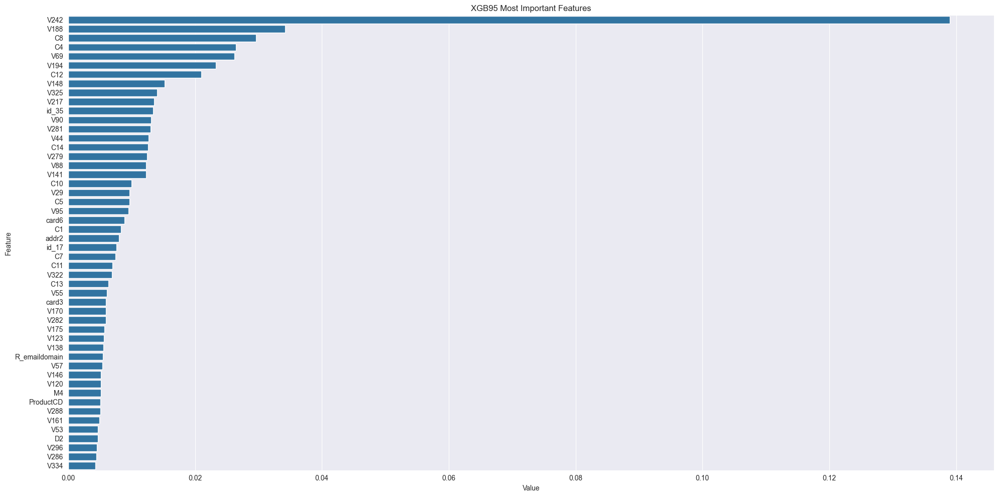

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(clf.feature_importances_,cols)), columns=['Value','Feature'])
plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False).iloc[:50])
plt.title('XGB95 Most Important Features')
plt.tight_layout()
plt.show()
#del clf, h; x=gc.collect()